<a href="https://colab.research.google.com/github/ShagMichail/Industrial-Analytics-Platforms/blob/main/Task/Task_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Задание 5


Подключаем необходимые библиотеки

In [1]:
!pip install pywavelets pyedflib mne autokeras --quiet

In [49]:
!pip install mlflow tensorflow --quiet

In [3]:
import warnings
warnings.filterwarnings('ignore')

import re
import os
import pywt
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import pyedflib
from scipy import signal
from scipy.fft import fft, fftfreq

###Задание 1
Сделайте скрипт для формирования обучающей выборки из базы данных ЭЭГ с указанными приступами



###Задание 2
Сформируйте не менее 50 записей с приступами и не менее 50 записей ЭЭГ без приступов. Записи нужно «обрезать» по времени и построить для них вейвлет изображение (можно разбить на диапазоны ритмов мозга, можно не разбивать). В итоге должно быть 100 «картинок».  


###Задание 3
Полученные изображения сложите в отдельные папки (место хранения выбирайте на свое усмотрение). Папки нужны для того, чтобы разделить изображения для записей с приступом и для записей без приступа.


In [4]:
def parse_summary_file():
    edf_files = []
    with open('chb22-summary.txt', 'r') as file:
        content = file.read()
        files = re.split(r'File Name: ', content)[1:]  # Разделение по файлам
        for file_info in files:
            lines = file_info.split('\n')
            file_name = lines[0].strip()
            seizure_start = []
            seizure_end = []
            num_seizures = 0
            k=0
            for line in lines[1:]:
                if 'Number of Seizures in File' in line:
                    num_seizures = int(line.split(':')[-1].strip())
                    k=num_seizures
                    continue

                if k > 0:
                    if ('Seizure' in line)and('Start Time' in line):
                        seizure_start_i = int(re.search(r'\d+', line.split(':')[-1].strip()).group())
                        seizure_start.append(seizure_start_i)
                        continue

                    if ('Seizure' in line)and('End Time' in line):
                        seizure_end_i = int(re.search(r'\d+', line.split(':')[-1].strip()).group())
                        seizure_end.append(seizure_end_i)
                        k-=1
                        continue

            edf_files.append({
                'file_name': file_name,
                'seizure_start': seizure_start,
                'seizure_end': seizure_end,
                'num_seizures': num_seizures
            })
    return edf_files

In [5]:
edf_files_list = parse_summary_file()
edf_files_list[:5]

[{'file_name': 'chb22_01.edf',
  'seizure_start': [],
  'seizure_end': [],
  'num_seizures': 0},
 {'file_name': 'chb22_02.edf',
  'seizure_start': [],
  'seizure_end': [],
  'num_seizures': 0},
 {'file_name': 'chb22_03.edf',
  'seizure_start': [],
  'seizure_end': [],
  'num_seizures': 0},
 {'file_name': 'chb22_04.edf',
  'seizure_start': [],
  'seizure_end': [],
  'num_seizures': 0},
 {'file_name': 'chb22_05.edf',
  'seizure_start': [],
  'seizure_end': [],
  'num_seizures': 0}]

In [6]:
def read_edf(file_path):
    with pyedflib.EdfReader(file_path) as f:
        n = f.signals_in_file
        signal_labels = f.getSignalLabels()
        signals = np.zeros((n, f.getNSamples()[0]))

        for i in range(n):
            signals[i, :] = f.readSignal(i)

    return signals, signal_labels

In [7]:
def butter_bandpass_filter(data, fs, plot_signal=False, order=5):
    # Определение диапазонов фильтрации
    lowcut = [1, 4, 8, 14, 30]
    highcut = [4, 8, 14, 20, 50]
    nyquist = 0.5 * fs

    # Список для хранения отфильтрованных сигналов
    filtered_signals = []

    # Фильтрация для каждого диапазона частот
    for i in range(len(lowcut)):
        low = lowcut[i] / nyquist
        high = highcut[i] / nyquist
        b, a = signal.butter(order, [low, high], btype='band')
        filtered_data = signal.lfilter(b, a, data)
        filtered_signals.append(filtered_data)

    # Построение спектров
    leg = ["Delta", "Theta","Alpha", "Beta","Gamma"]
    for i, filtered_data in enumerate(filtered_signals):
        # Преобразование Фурье
        signal_fft = fft(filtered_data)
        # Амплитуды и частоты
        amplitudes = np.abs(signal_fft) / len(filtered_data)
        frequencies = fftfreq(len(filtered_data), 1 / fs)

        # Отбираем только положительные частоты
        positive_freqs = frequencies > 0
        frequencies = frequencies[positive_freqs]
        amplitudes = amplitudes[positive_freqs]

    return filtered_signals

In [8]:
def save_wavelet_transform(signal, file_name, output_dir, start_time, end_time, sampling_rate, time_label):
    scale_max = [200, 50, 26, 14, 6]
    scale_min = [50, 26, 14, 6, 3.5]
    wavelet_core = 'morl'
    dt = 1 / sampling_rate
    leg = ["Delta", "Theta","Alpha", "Beta","Gamma"]
    v_max = [240, 120, 40, 30, 20]
    for k in range(len(signal)):
            scales = np.linspace(scale_min[k], scale_max[k], num=25, endpoint=True)
            coef, freqs = pywt.cwt(signal[k], scales, wavelet_core, sampling_period=dt)
            frequencies = pywt.scale2frequency(wavelet_core, scales) / dt

            # Создаем кастомную цветовую карту от синего до красного с пределами мощности от 0 до 20
            colors = [(0, 'blue'), (0.5, 'cyan'), (0.9, 'yellow'), (1, 'darkred')]
            custom_cmap = mcolors.LinearSegmentedColormap.from_list('custom_cmap', colors)
            ax = plt.subplot(5, 1, k + 1)

            extent = [start_time, end_time, frequencies[-1], frequencies[0]]  # Устанавливаем частоту на вертикальной оси
            # Используем фиксированные пределы vmin=0 и vmax=20
            img = ax.imshow(np.abs(coef), extent=extent, cmap=custom_cmap, aspect='auto', vmin=0, vmax=v_max[k])
            ax.set_ylabel('Frequency (Hz)')
            ax.set_xlabel('Time (seconds)')
            ax.set_ylim(frequencies[-1], frequencies[0])

            # Сохранение изображения
    output_path = os.path.join(output_dir, f'{file_name}_{time_label}_wavelet.png')
    plt.savefig(output_path)
    plt.show()
    plt.close()

    return output_path

In [9]:
# процедура осреднения сигнала - убираем постоянную составляющую
def mean_delete(filtered_alpha,window_count,sampling_rate,time,plot_signal=False):
    leg = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
    leg2 = ['Delta_m', 'Theta_m', 'Alpha_m', 'Beta_m','Gamma_m']
    processed_signals = []

    plt.figure(figsize =(15,7))
    fig, axes = plt.subplots(5, 1, figsize=(12, 12))

    for i in range(5):
        filtered_1 = filtered_alpha[i]
        filtered_2 = measured(filtered_1,window_count,sampling_rate)
        processed_signals.append(filtered_2)
        if plot_signal:
            pylab.subplot (5, 1, i+1)
            plt.plot(time, filtered_1, label = leg[i])
            plt.plot(time, filtered_2, label = leg2[i])
            plt.legend(loc='best')
            plt.xlim([2310, 2311])

    return processed_signals


In [10]:

# процедура выделения из всего сигнала окна для выгрузки части сионала
def measured(signal,window_size,sampling_time):
    window_size = int(window_size * sampling_time)
    a = 0
    b = window_size
    n = signal.size / window_size
    f_signal = np.copy(signal)

    for i in range(int(n)):
        a = i * window_size
        b = (i + 1) * window_size
        f_signal[a:b] = signal[a:b] - np.mean(signal[a:b])

    return f_signal

In [11]:
sampling_rate = 256
window_count = 0.5
flag = 0

<Figure size 1500x700 with 0 Axes>

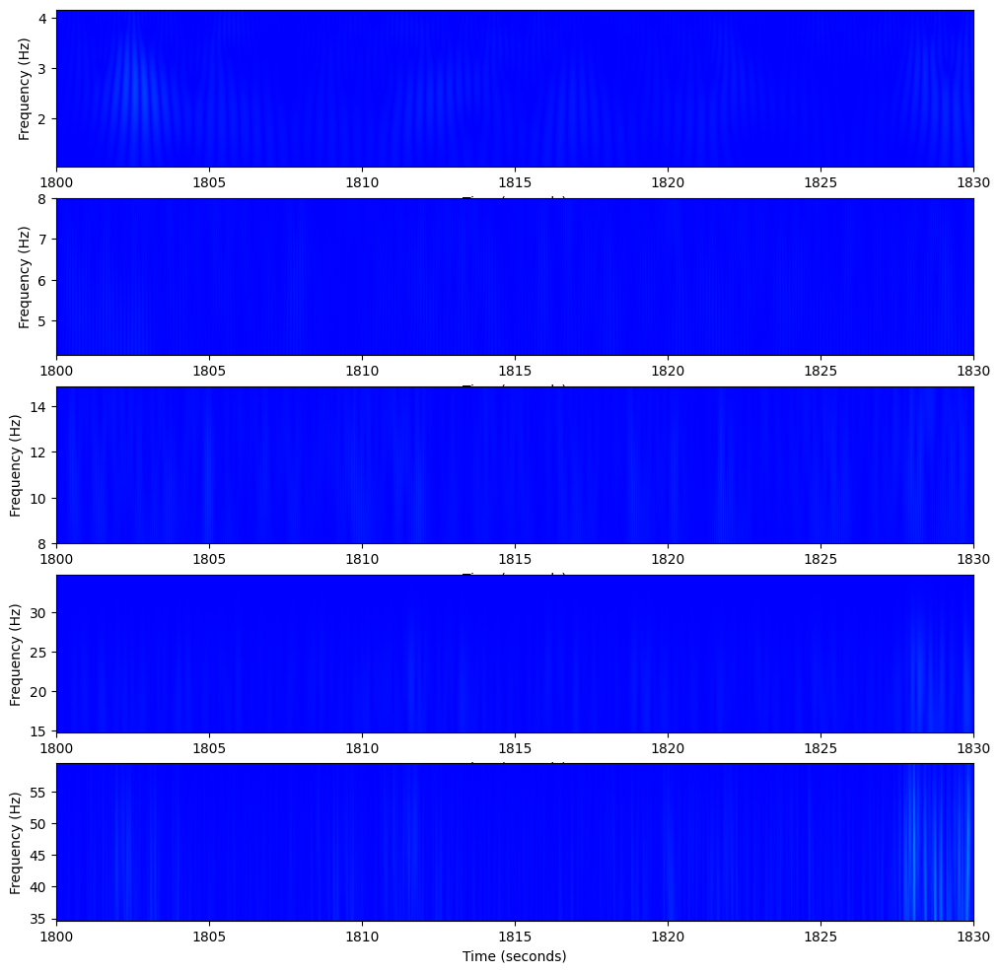

<Figure size 1500x700 with 0 Axes>

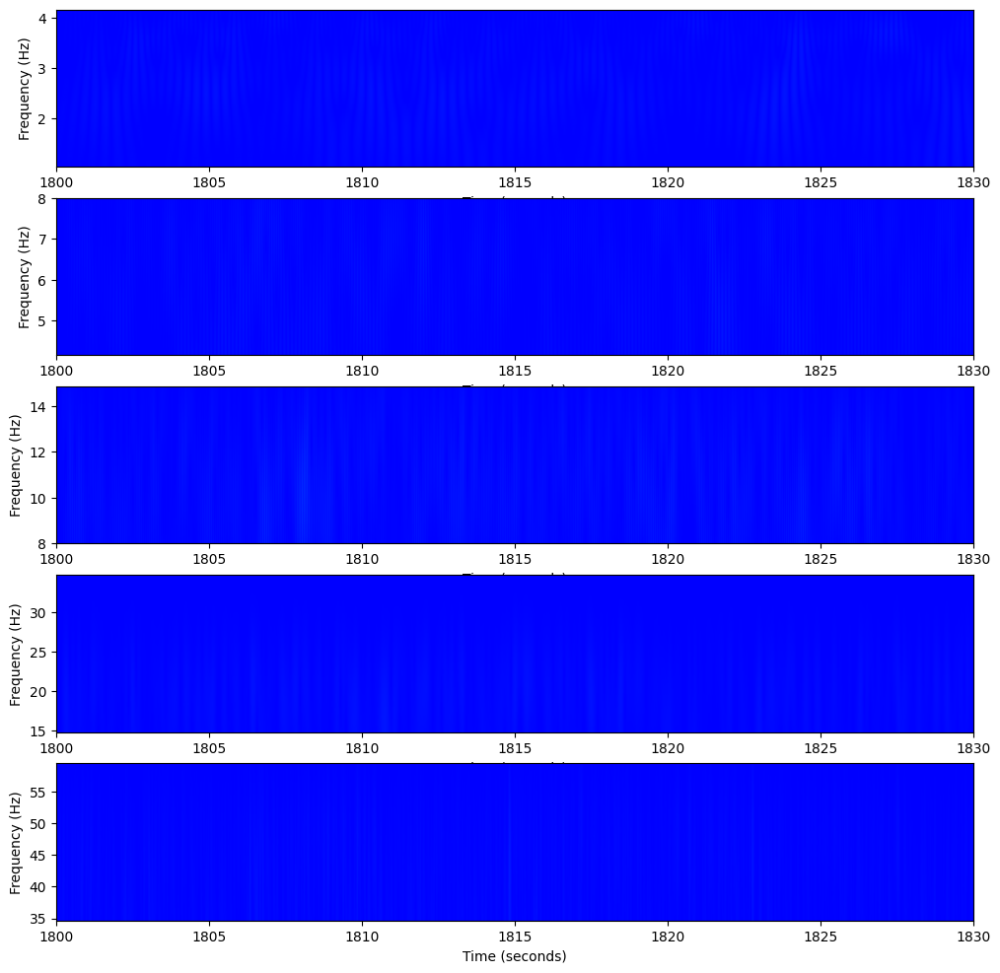

<Figure size 1500x700 with 0 Axes>

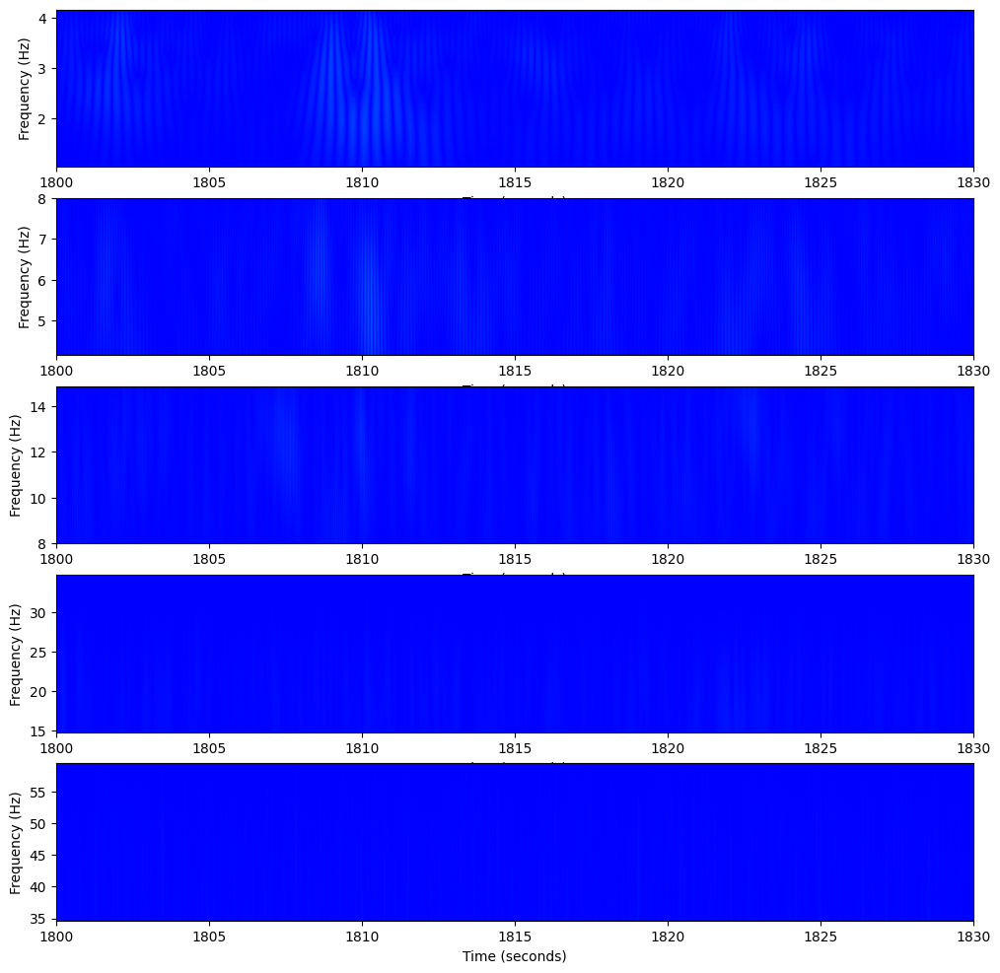

<Figure size 1500x700 with 0 Axes>

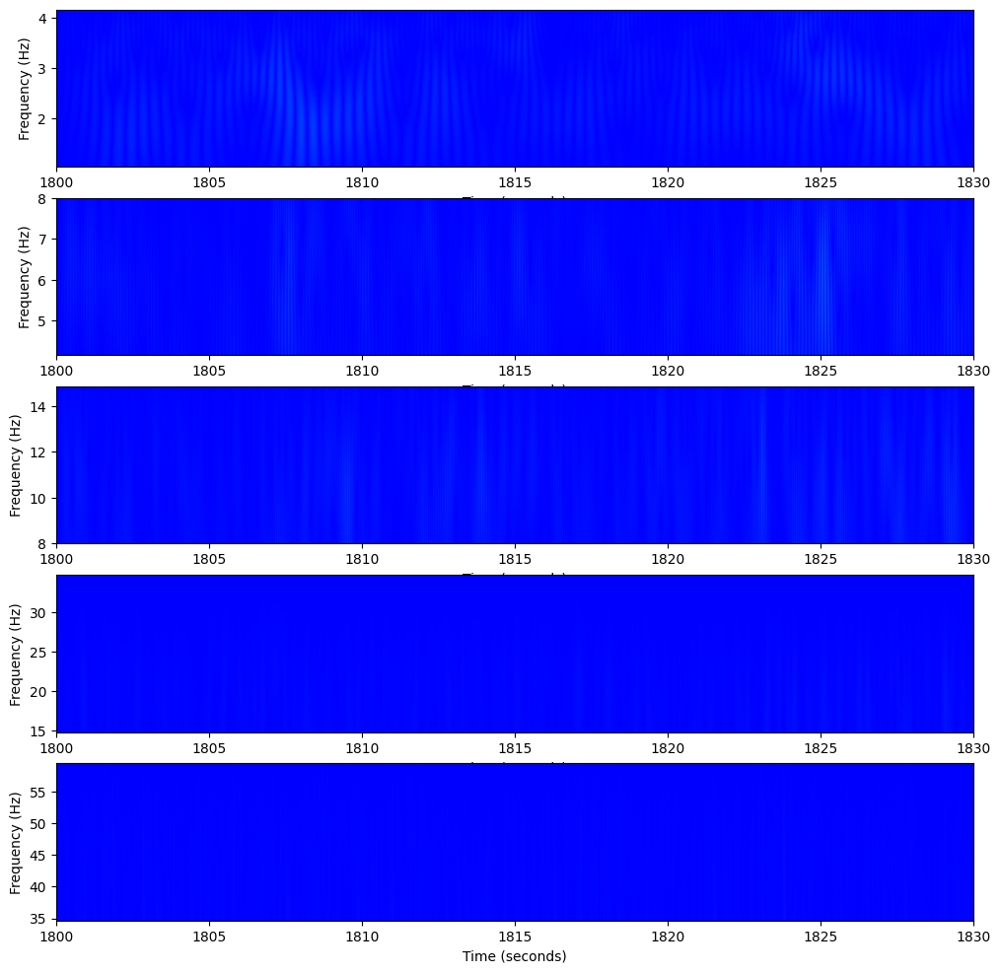

<Figure size 1500x700 with 0 Axes>

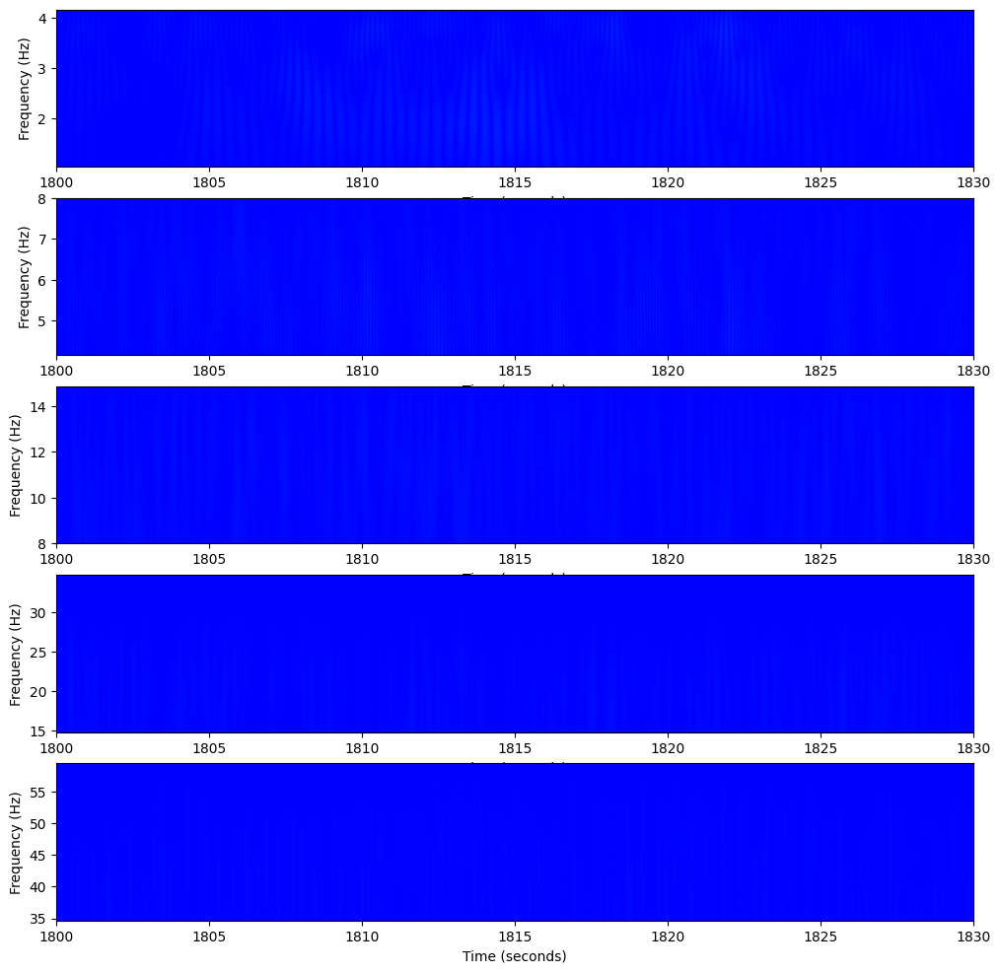

<Figure size 1500x700 with 0 Axes>

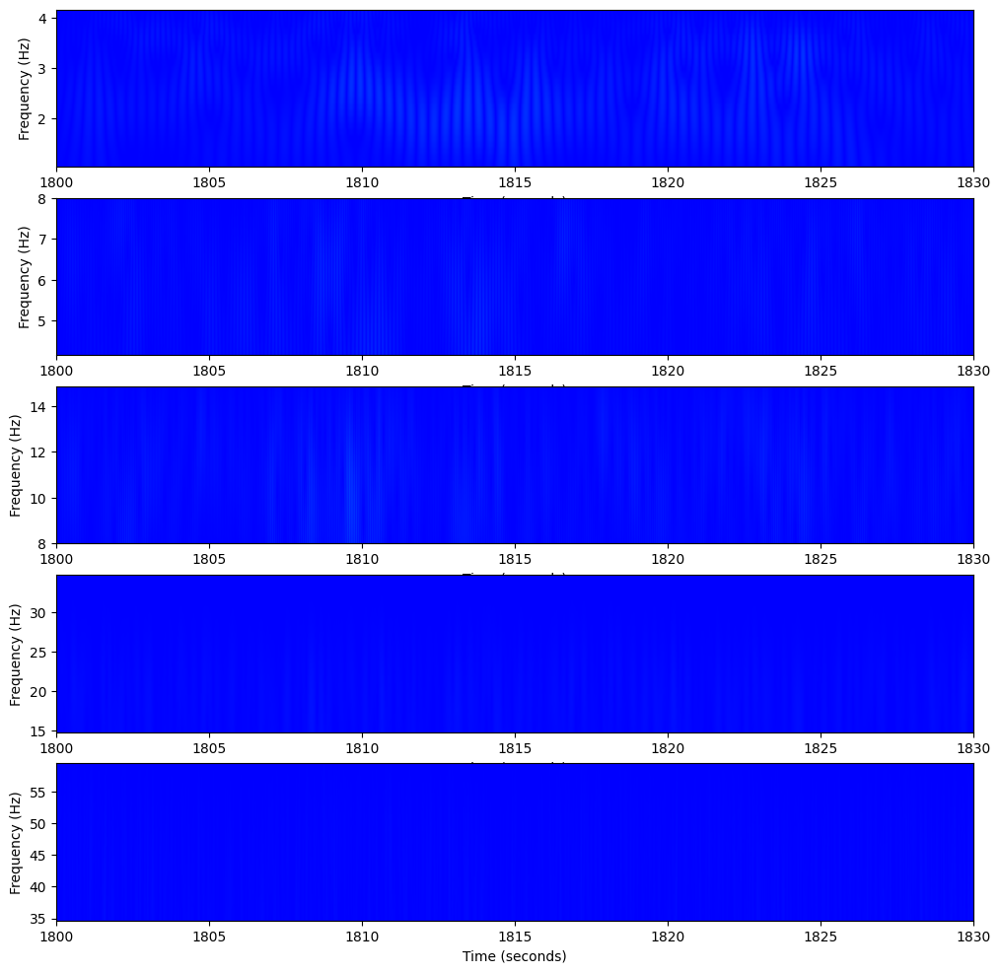

<Figure size 1500x700 with 0 Axes>

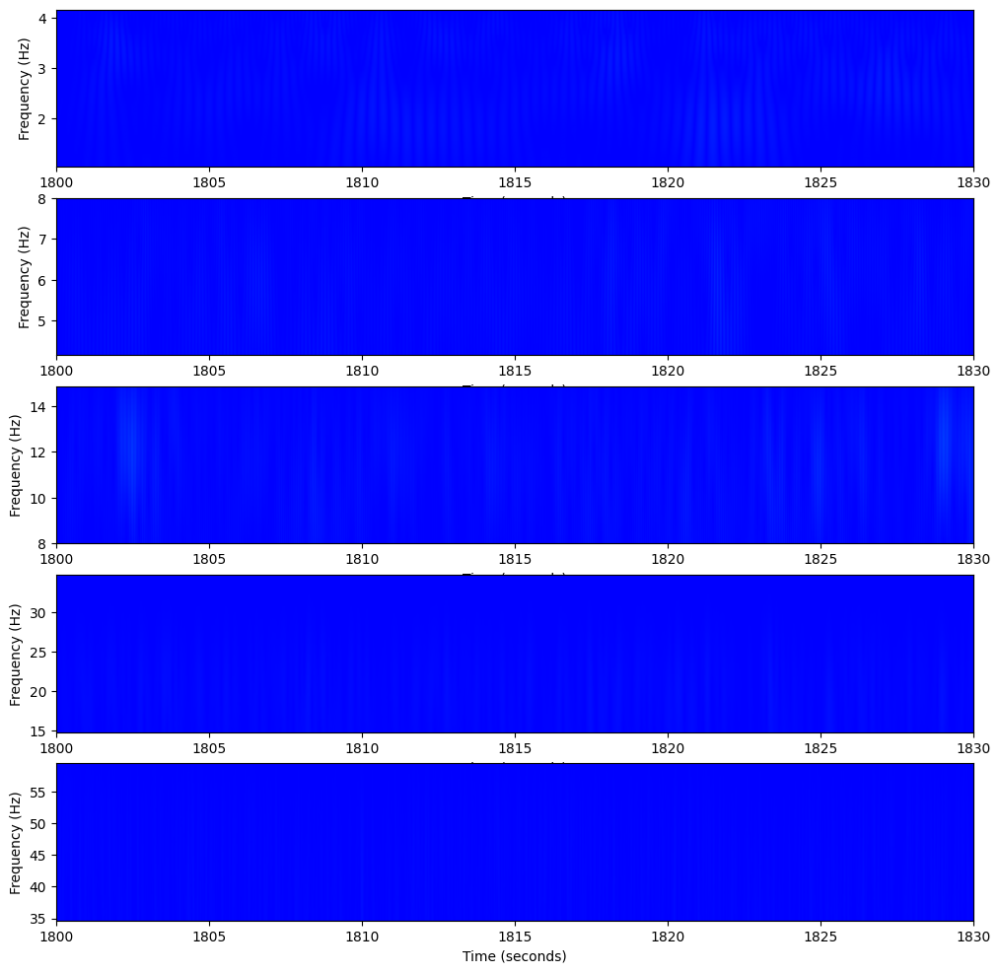

<Figure size 1500x700 with 0 Axes>

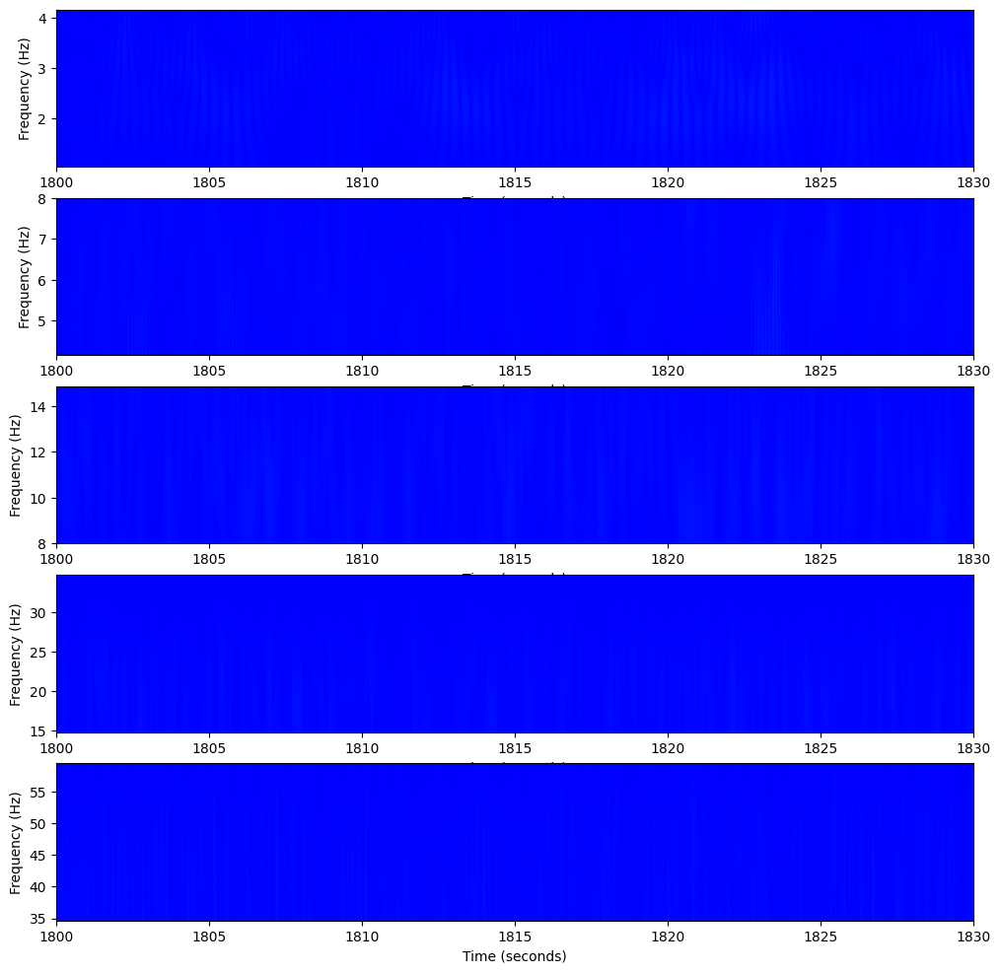

<Figure size 1500x700 with 0 Axes>

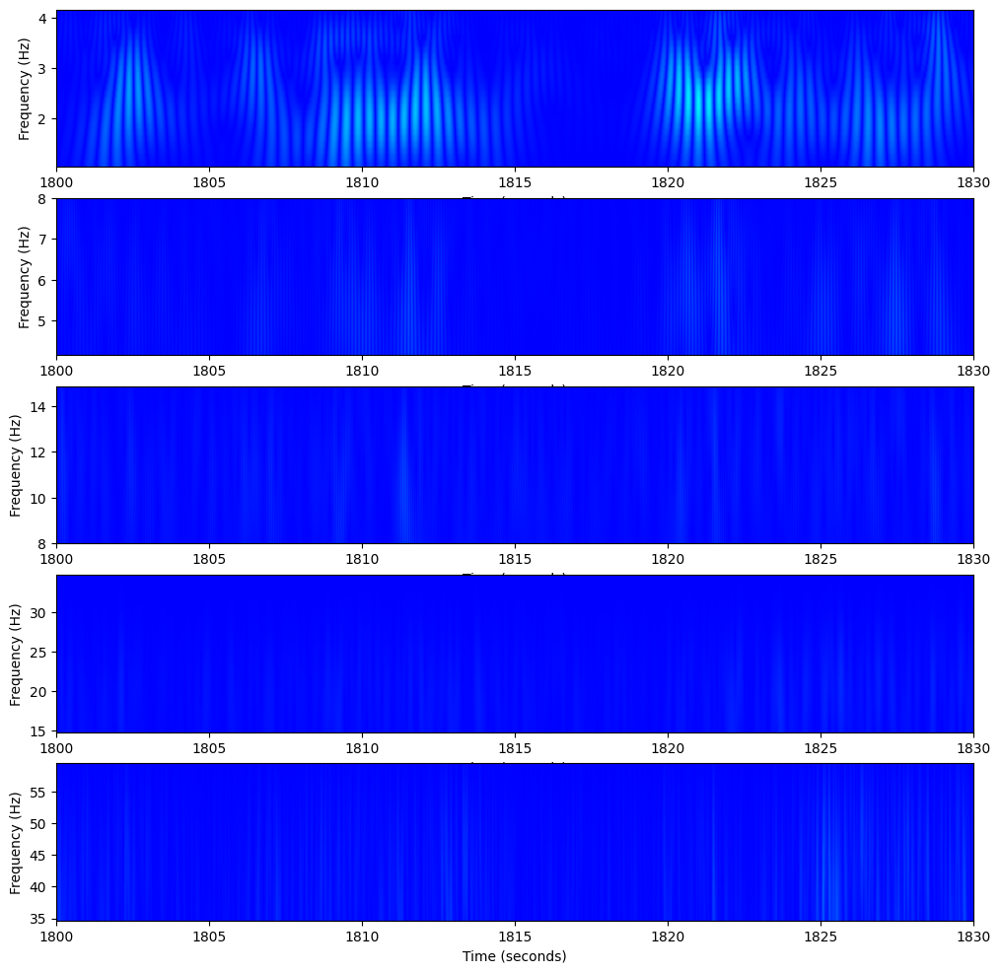

<Figure size 1500x700 with 0 Axes>

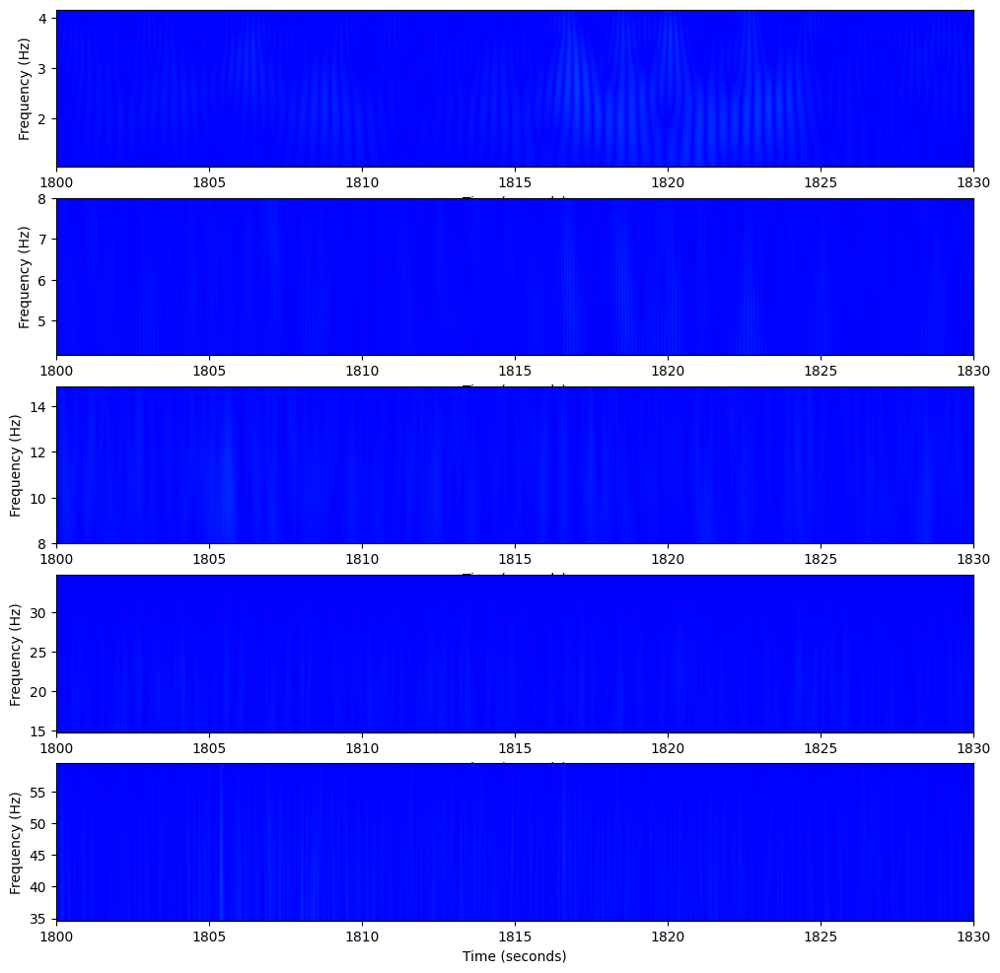

<Figure size 1500x700 with 0 Axes>

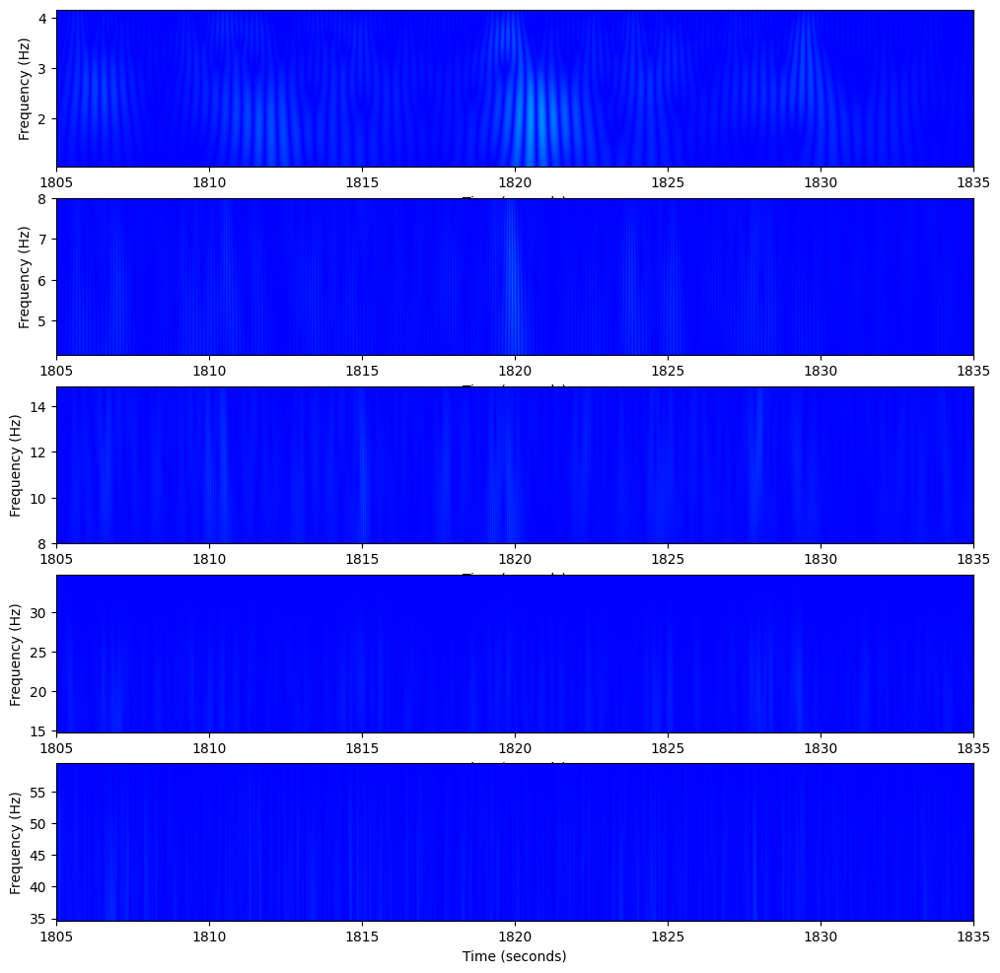

<Figure size 1500x700 with 0 Axes>

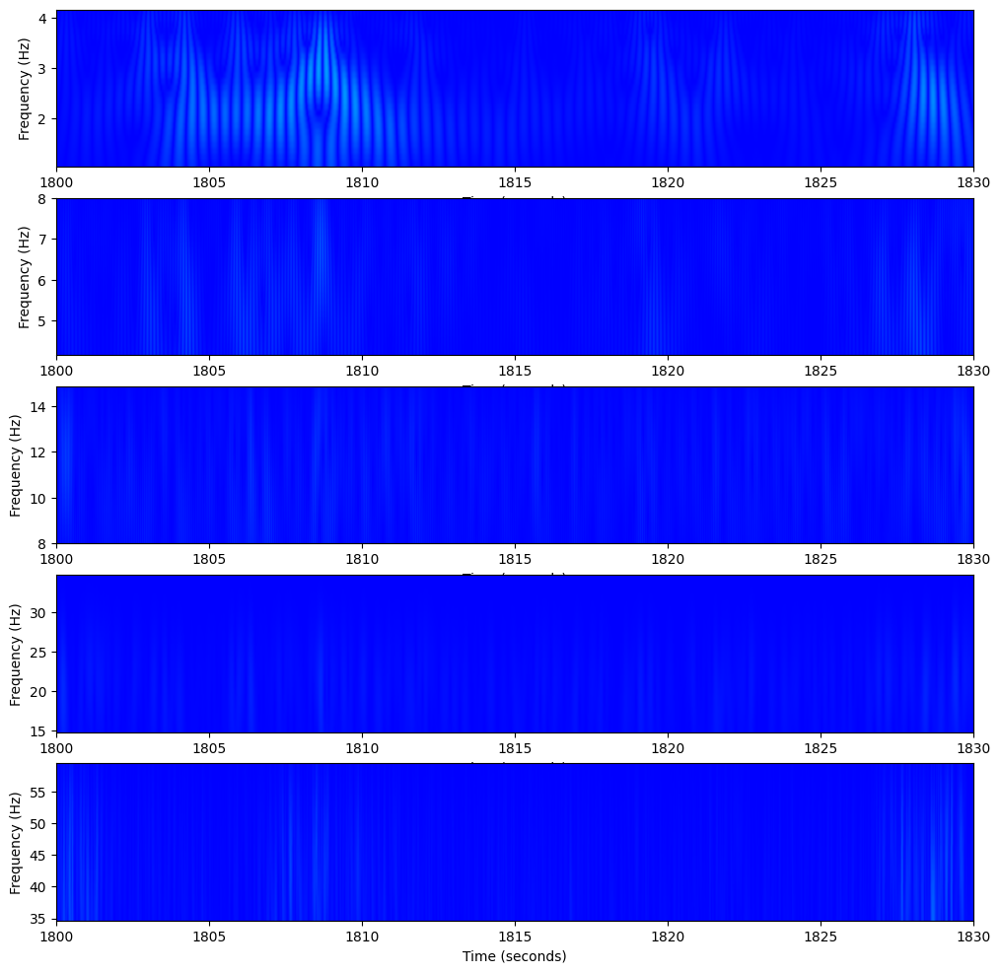

<Figure size 1500x700 with 0 Axes>

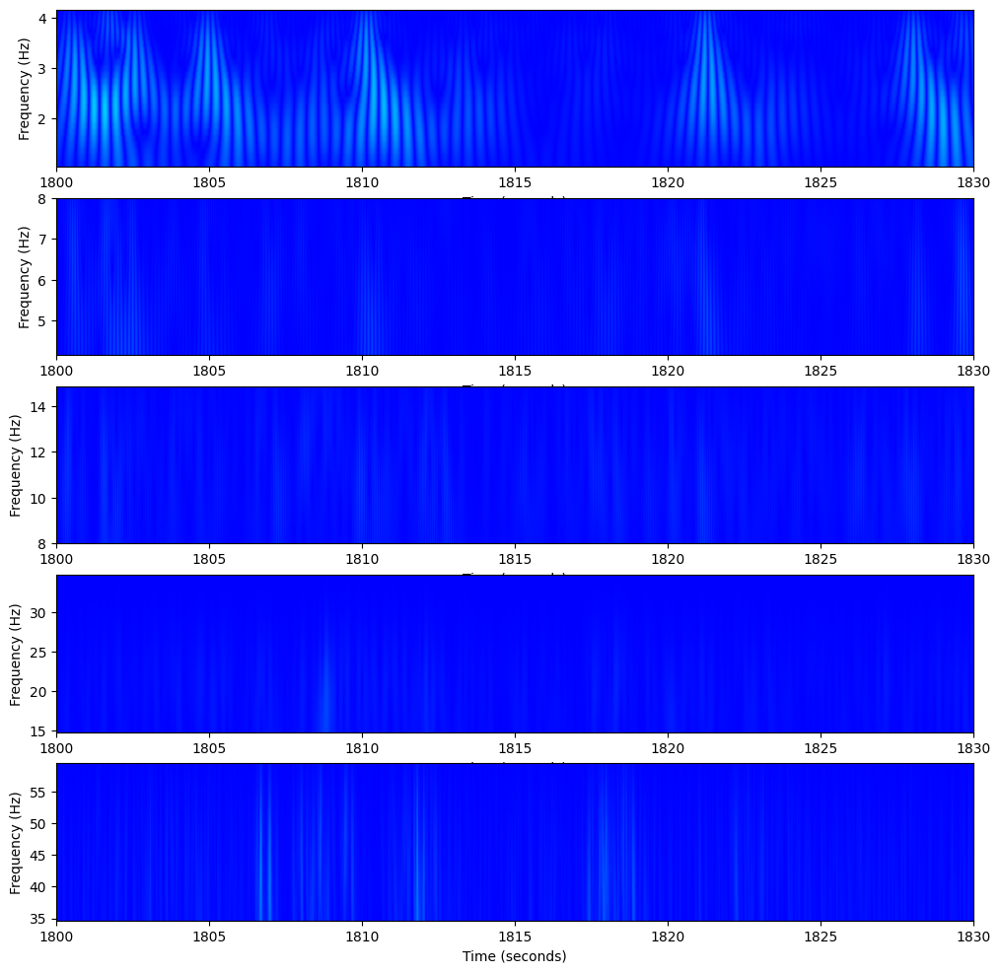

<Figure size 1500x700 with 0 Axes>

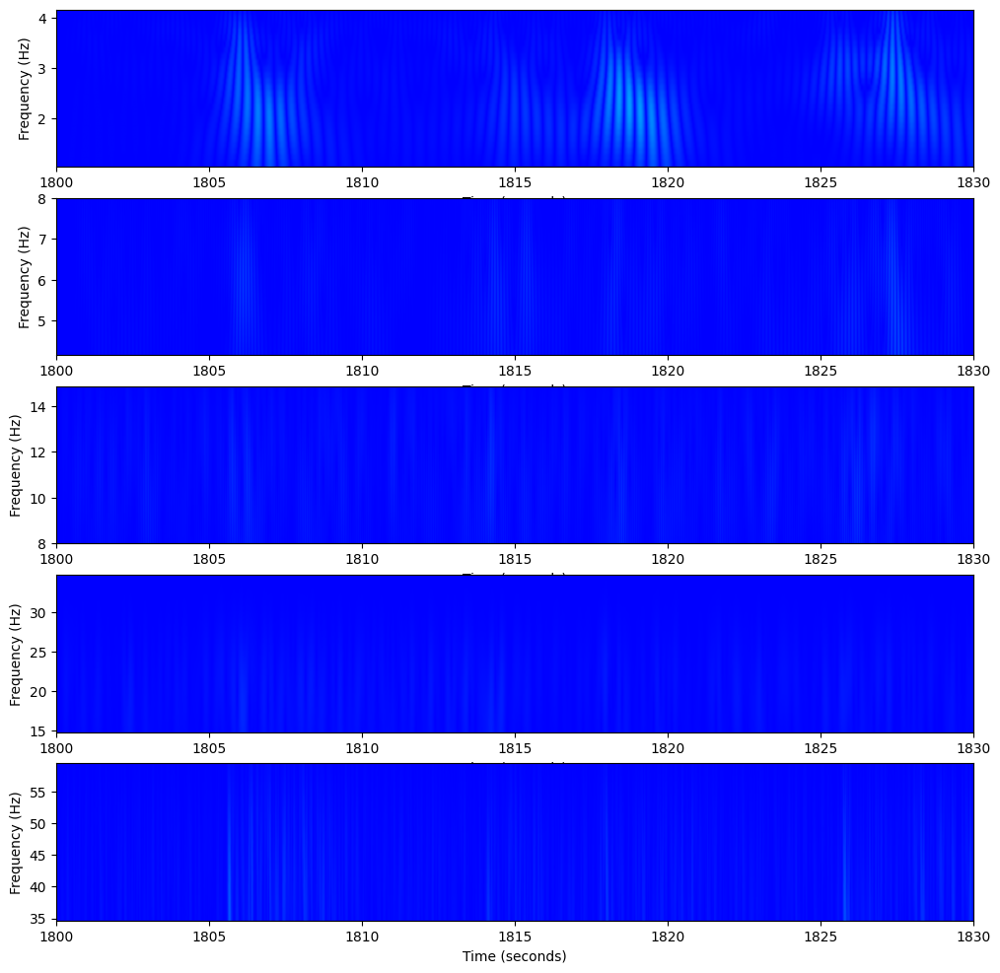

<Figure size 1500x700 with 0 Axes>

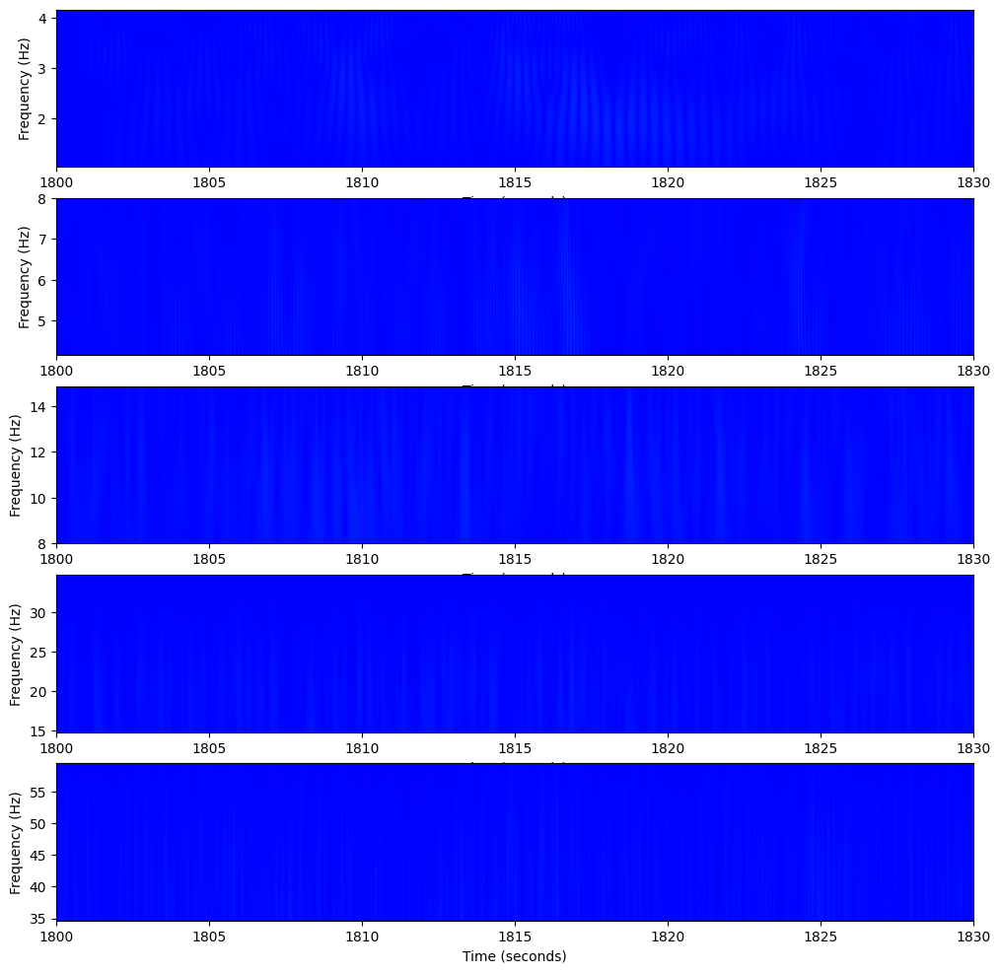

<Figure size 1500x700 with 0 Axes>

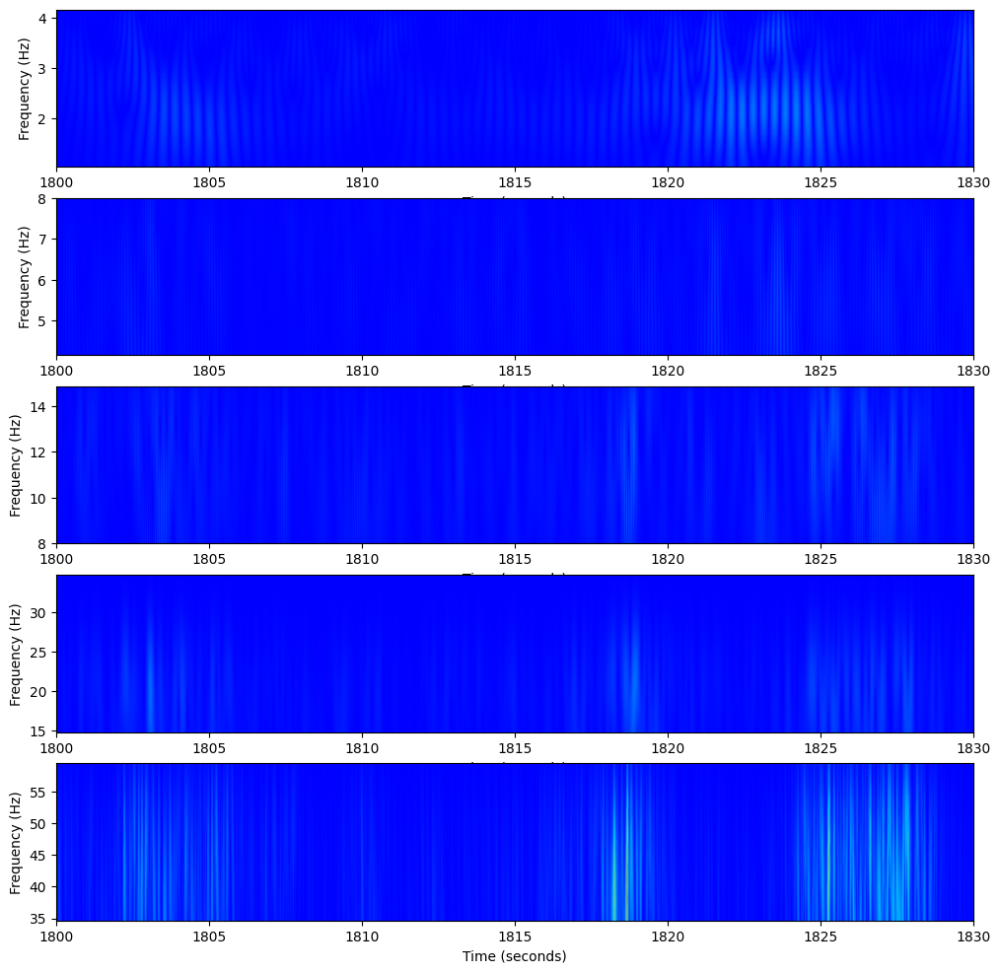

<Figure size 1500x700 with 0 Axes>

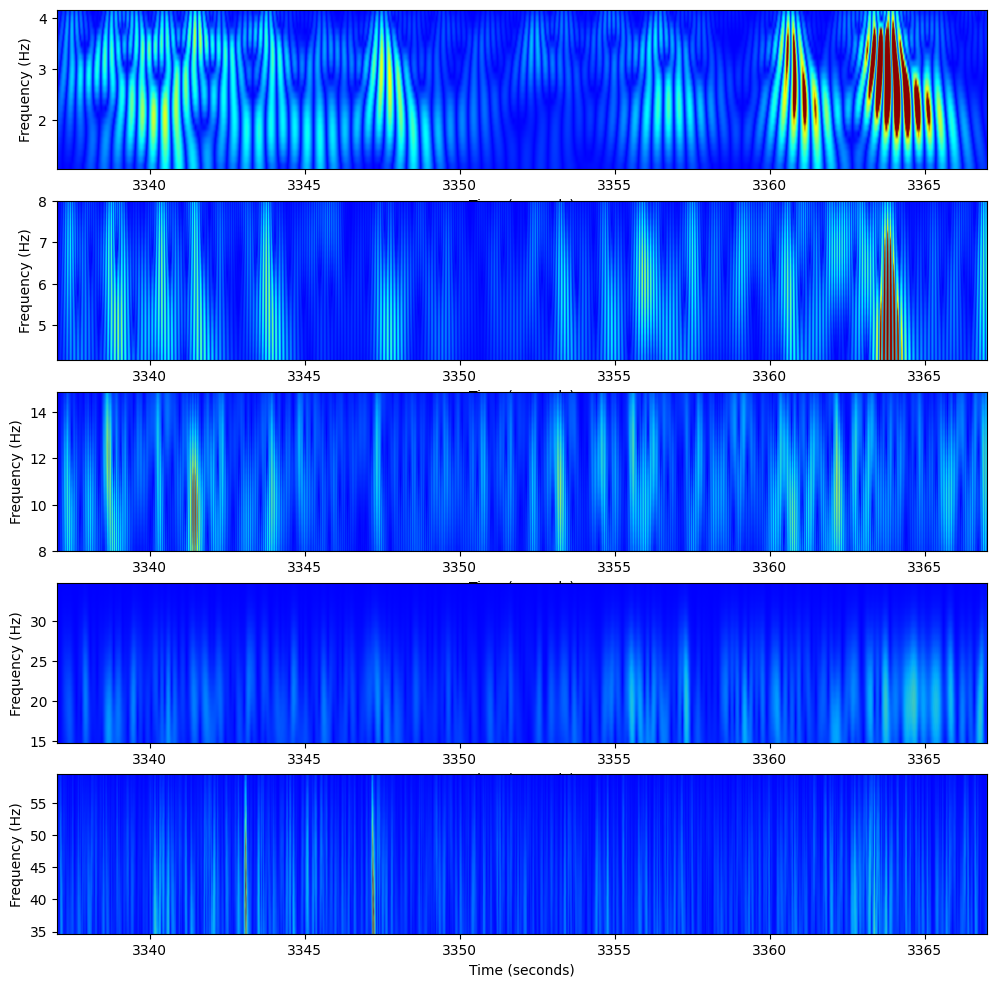

<Figure size 1500x700 with 0 Axes>

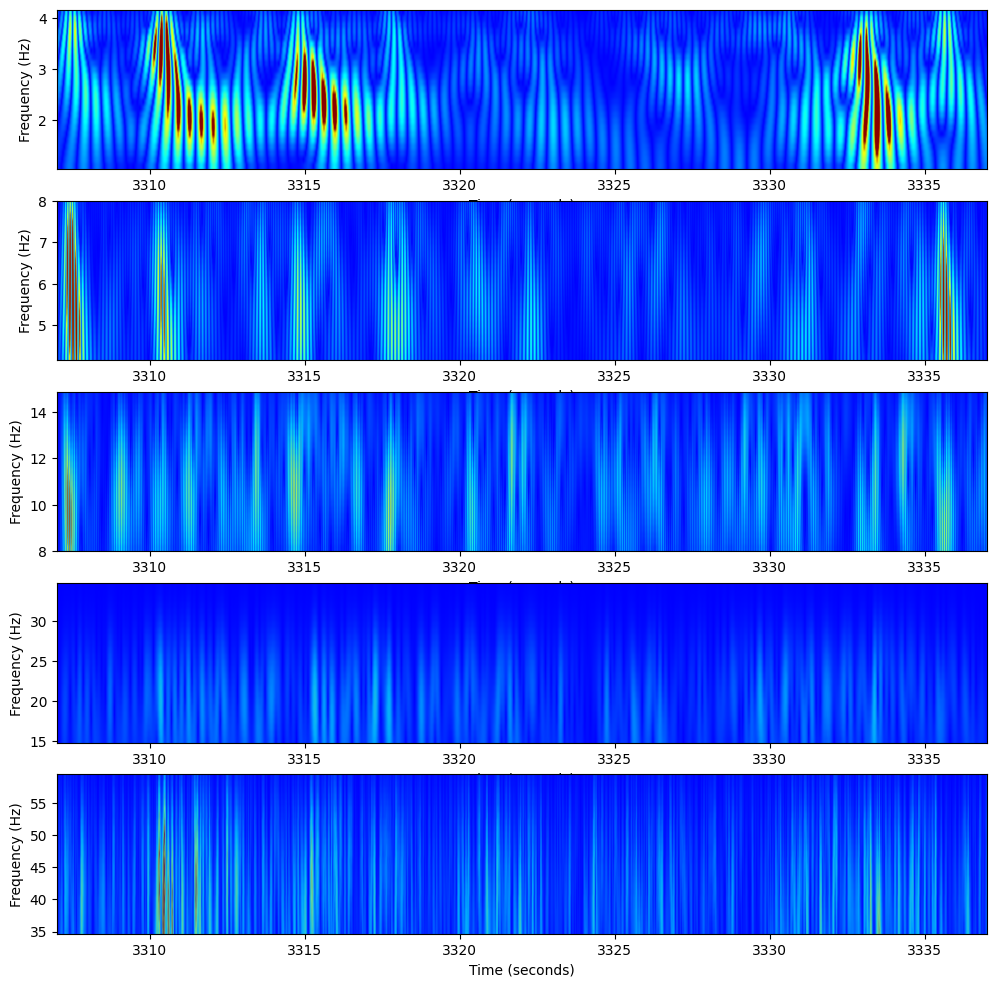

<Figure size 1500x700 with 0 Axes>

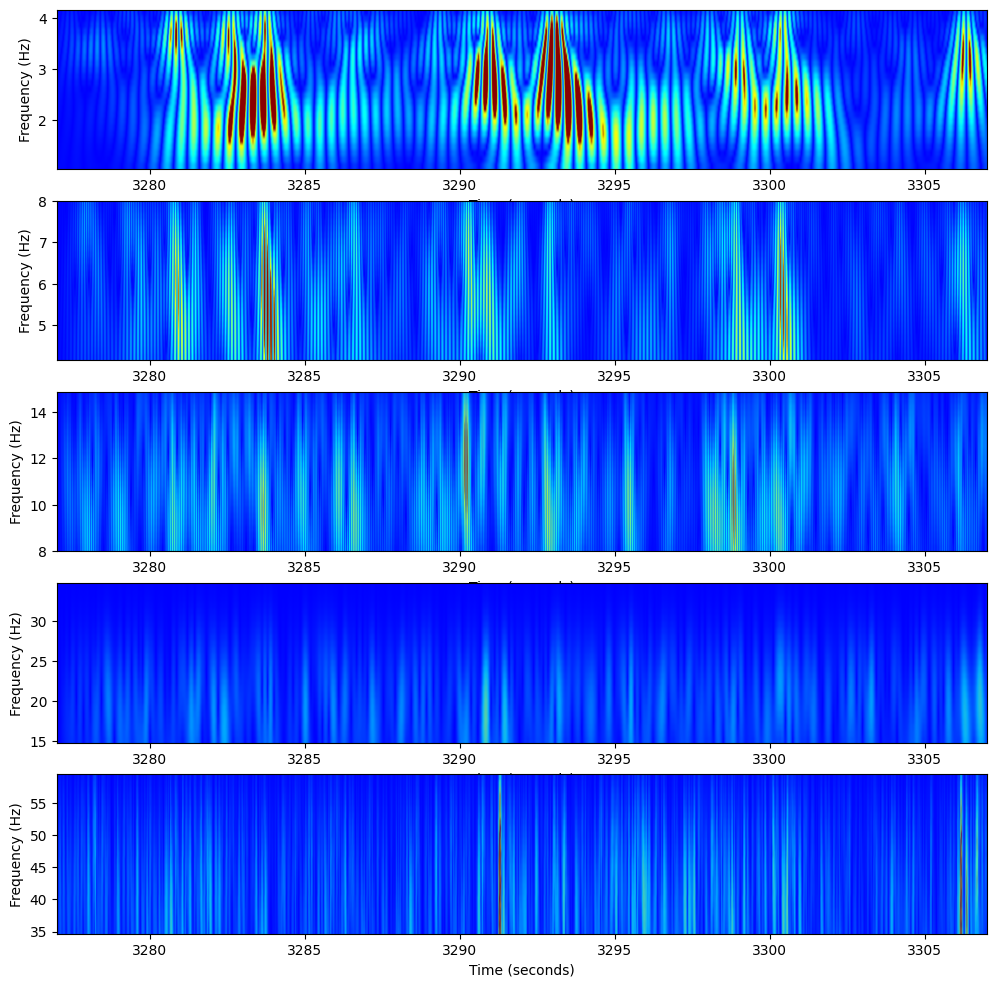

<Figure size 1500x700 with 0 Axes>

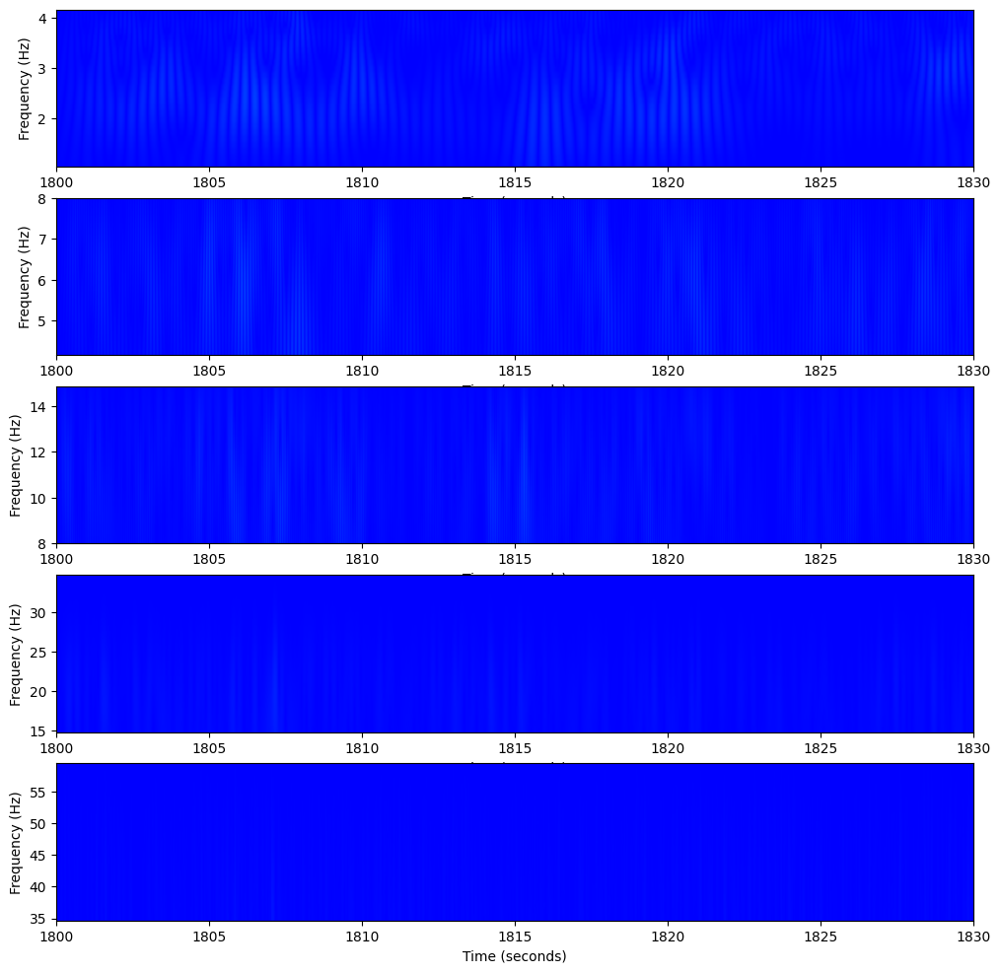

<Figure size 1500x700 with 0 Axes>

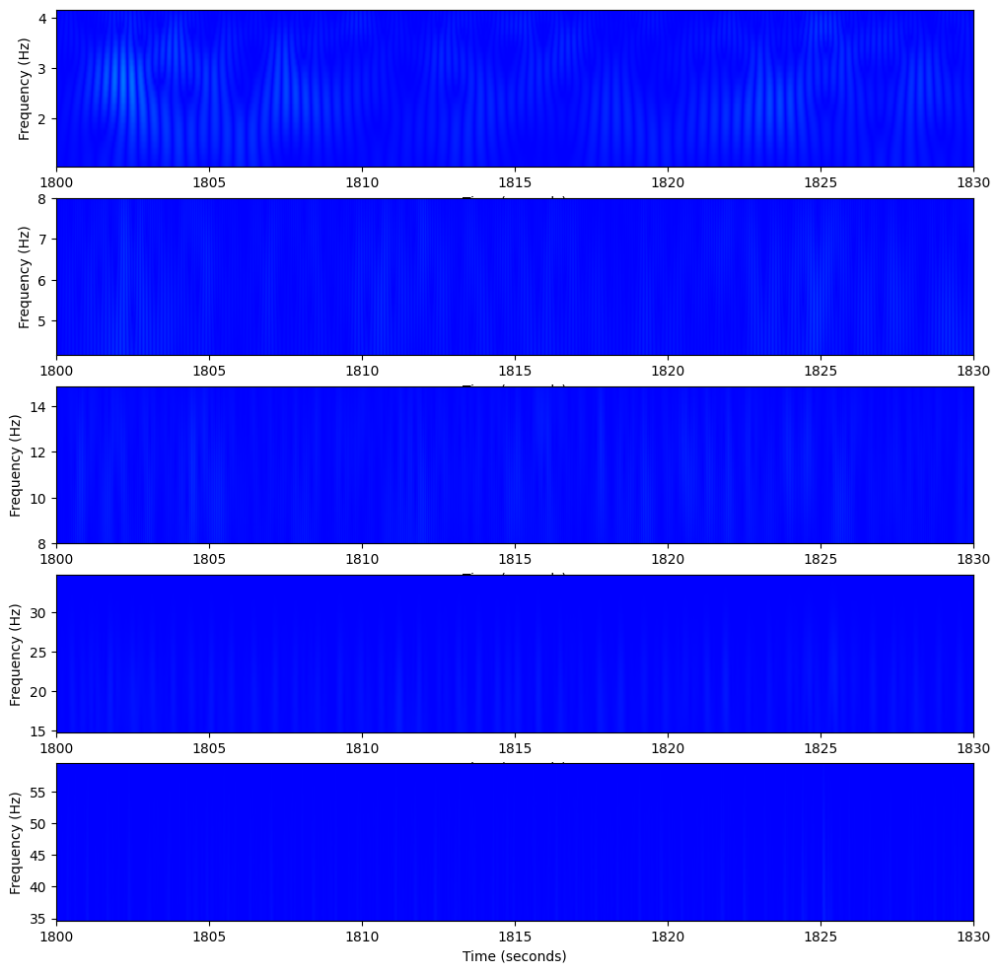

<Figure size 1500x700 with 0 Axes>

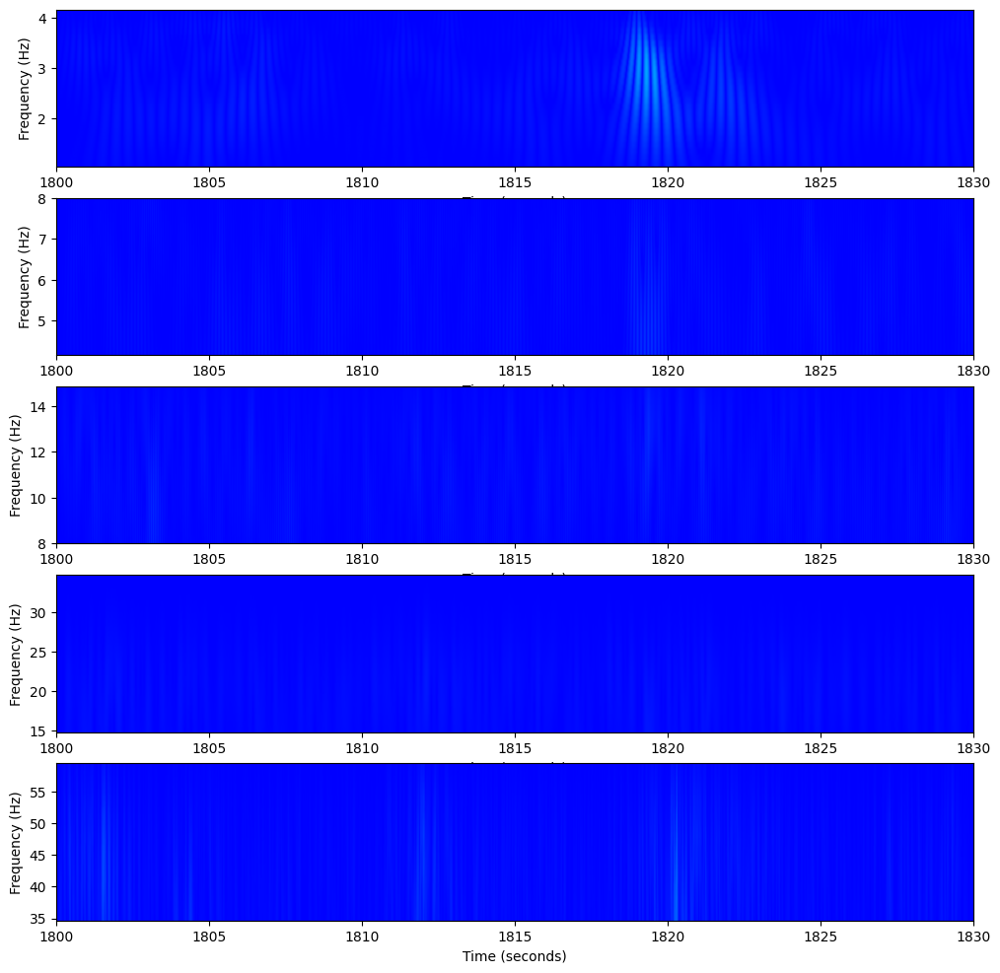

<Figure size 1500x700 with 0 Axes>

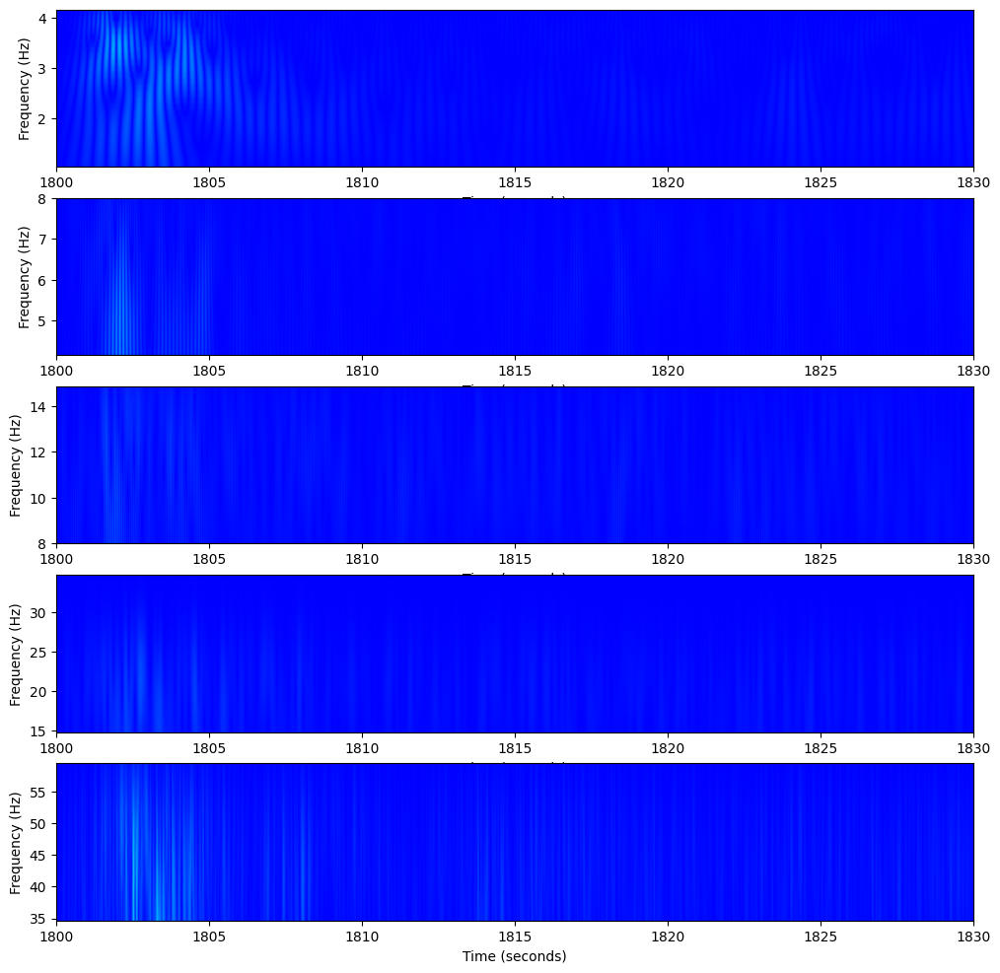

<Figure size 1500x700 with 0 Axes>

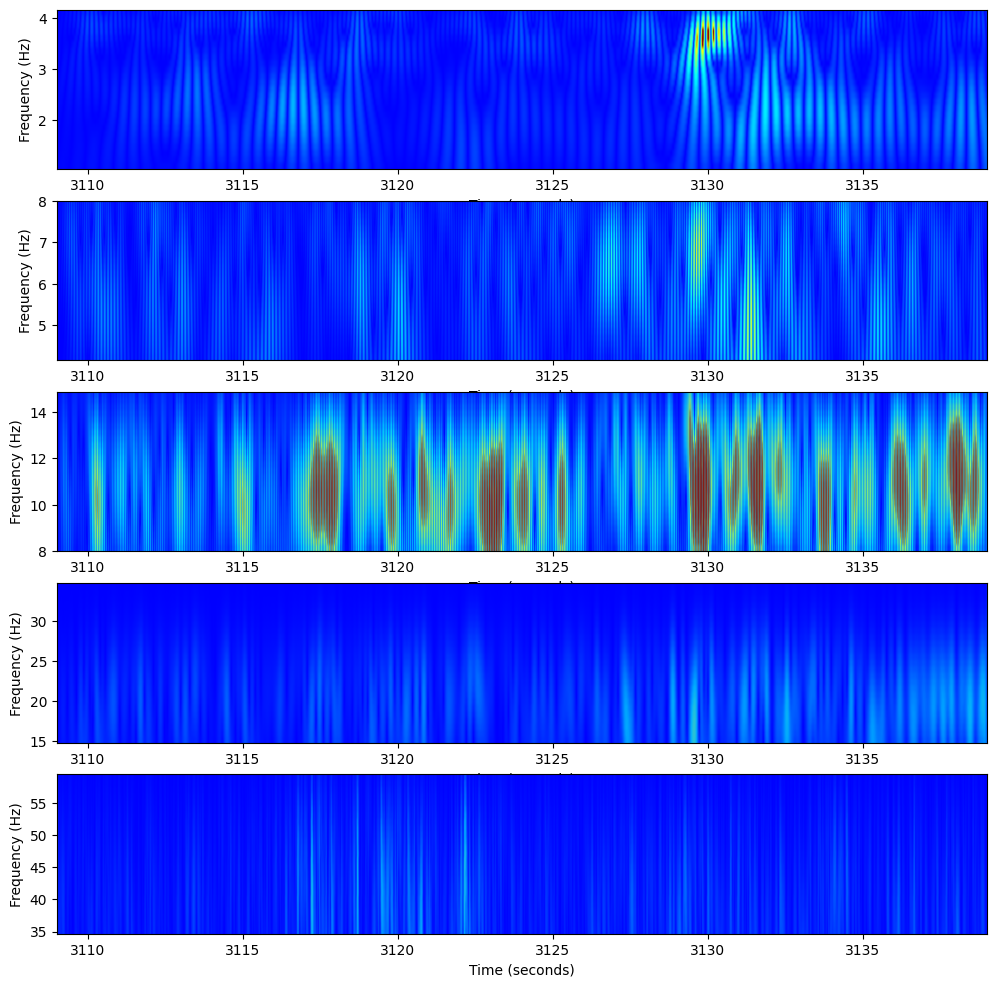

<Figure size 1500x700 with 0 Axes>

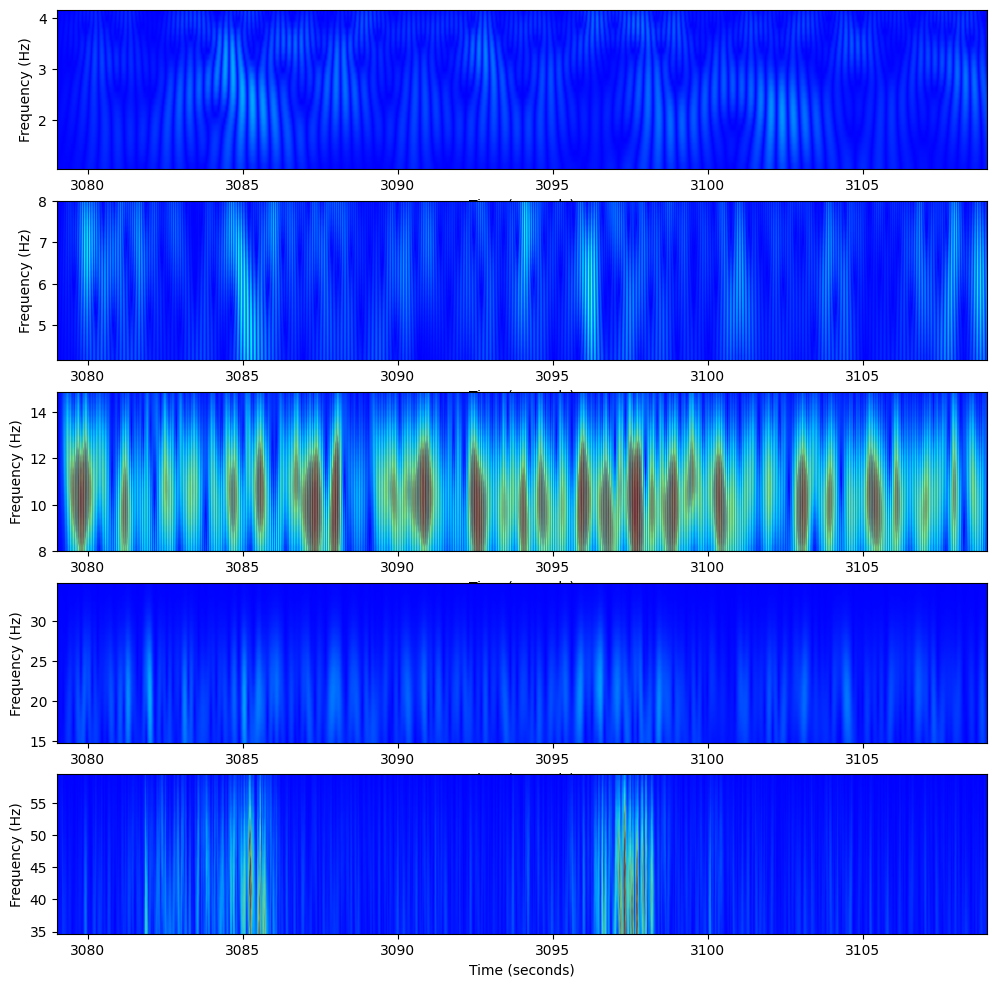

<Figure size 1500x700 with 0 Axes>

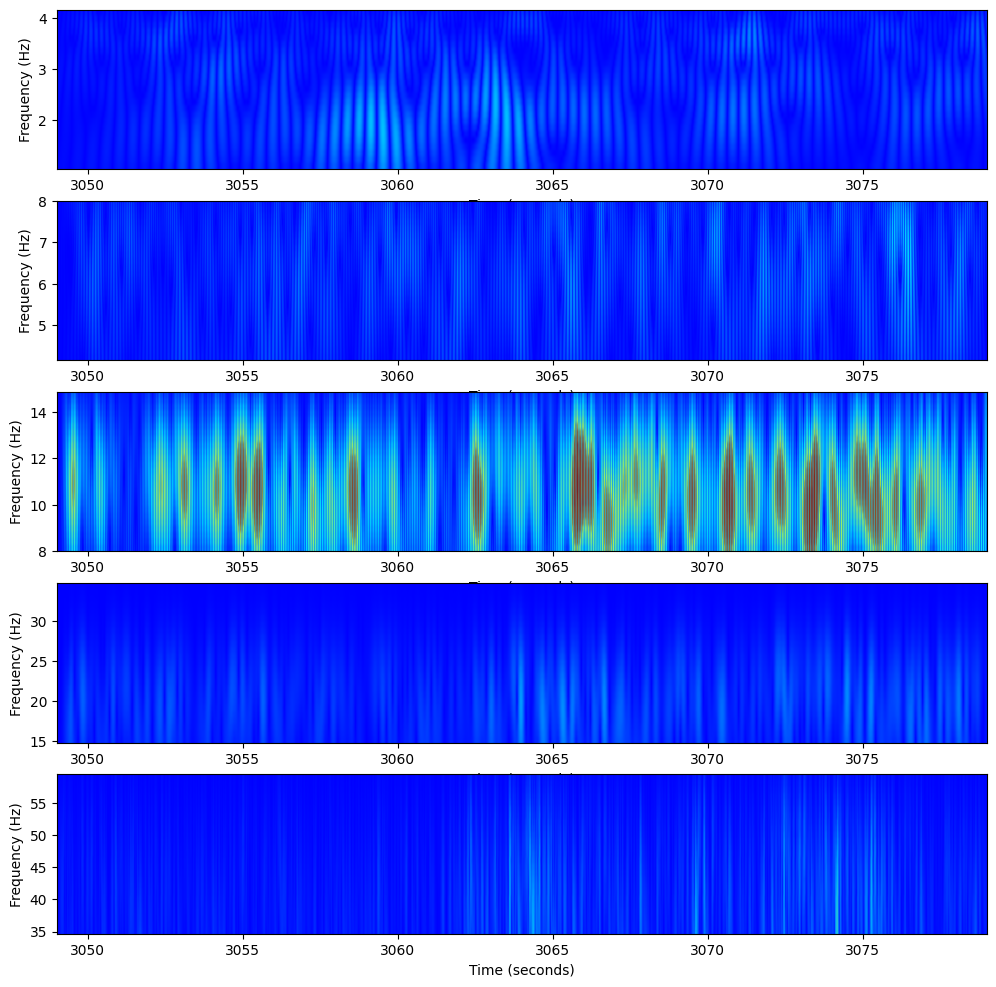

<Figure size 1500x700 with 0 Axes>

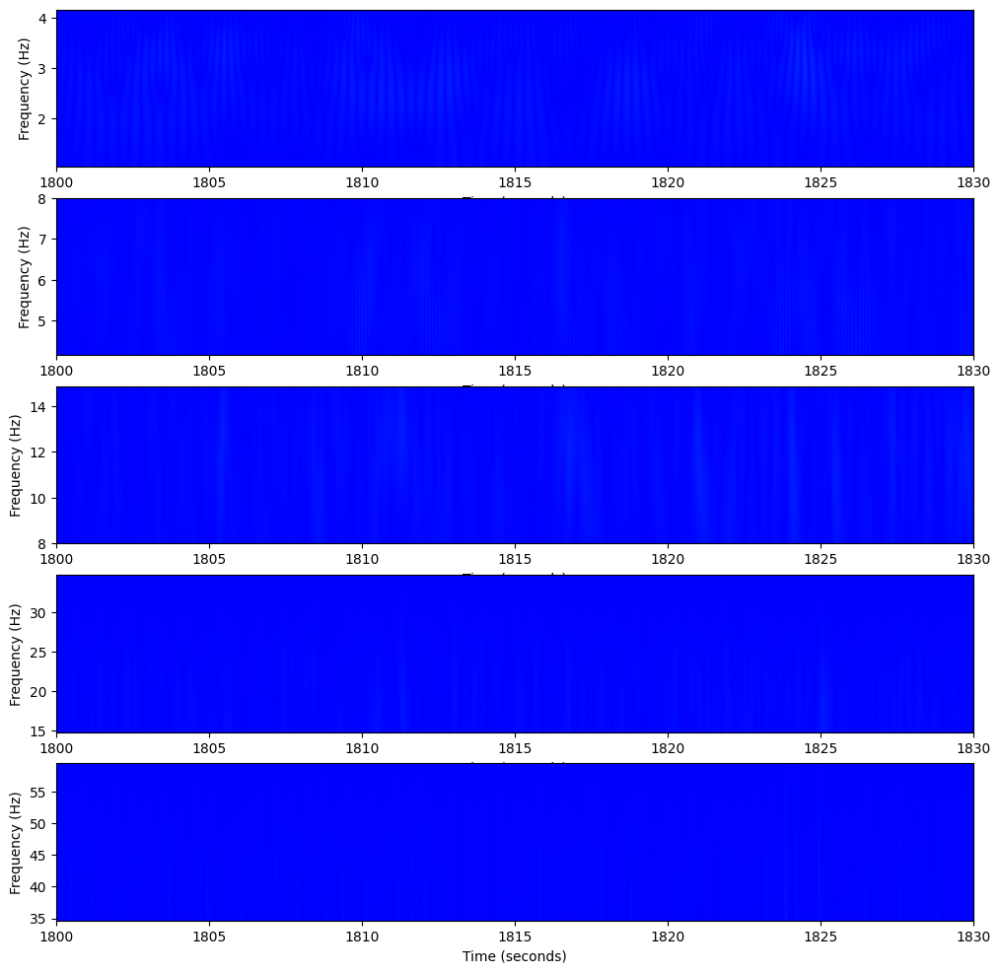

<Figure size 1500x700 with 0 Axes>

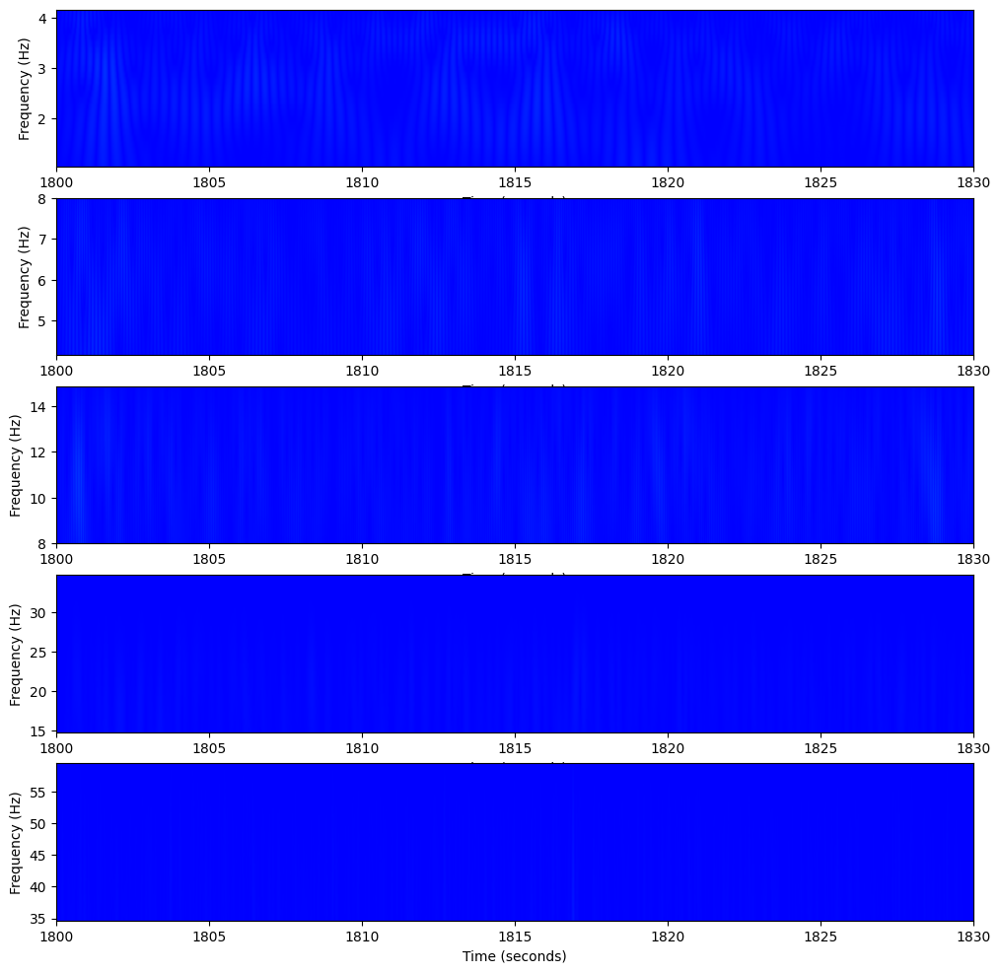

<Figure size 1500x700 with 0 Axes>

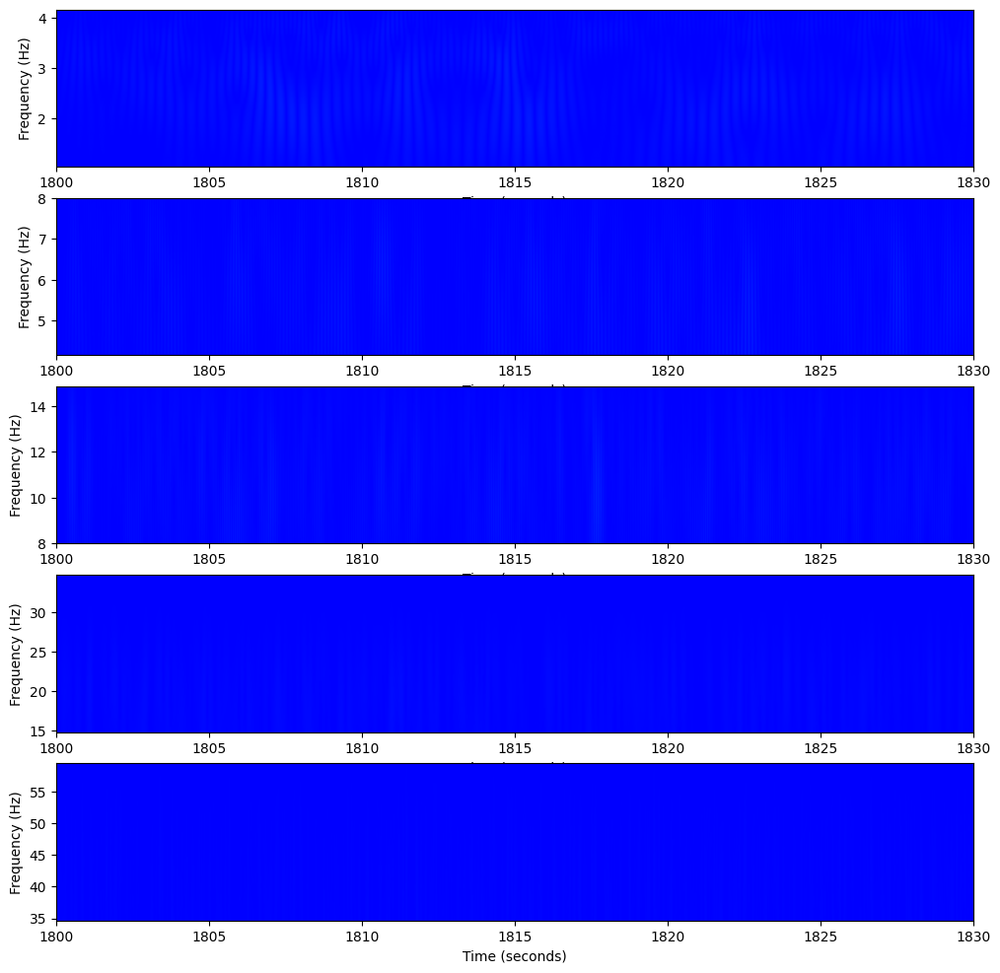

<Figure size 1500x700 with 0 Axes>

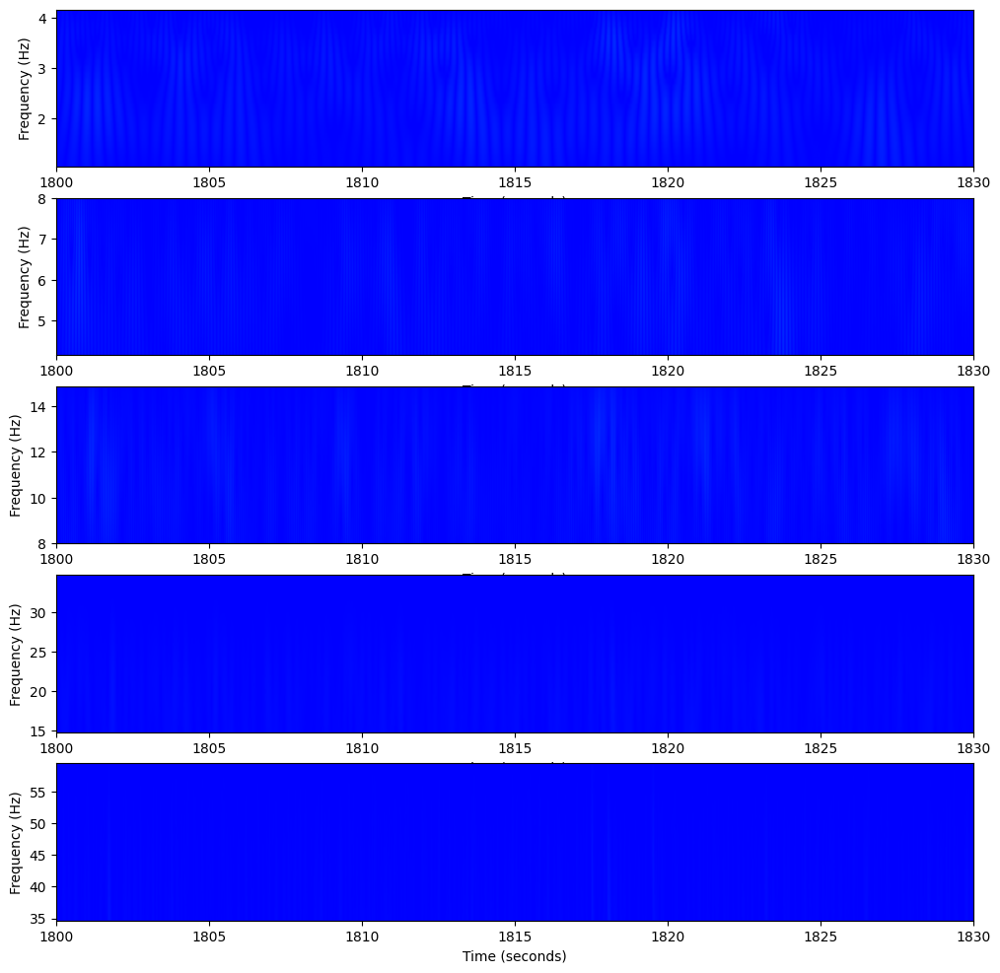

<Figure size 1500x700 with 0 Axes>

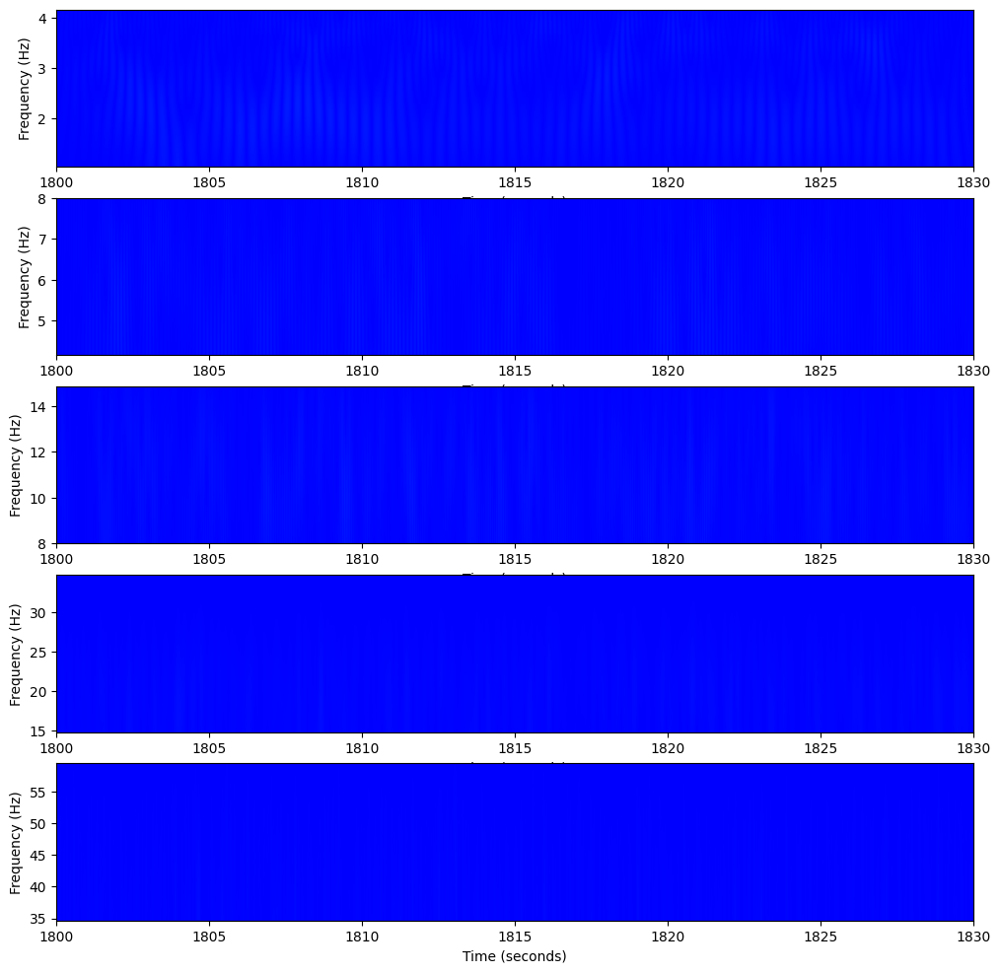

<Figure size 1500x700 with 0 Axes>

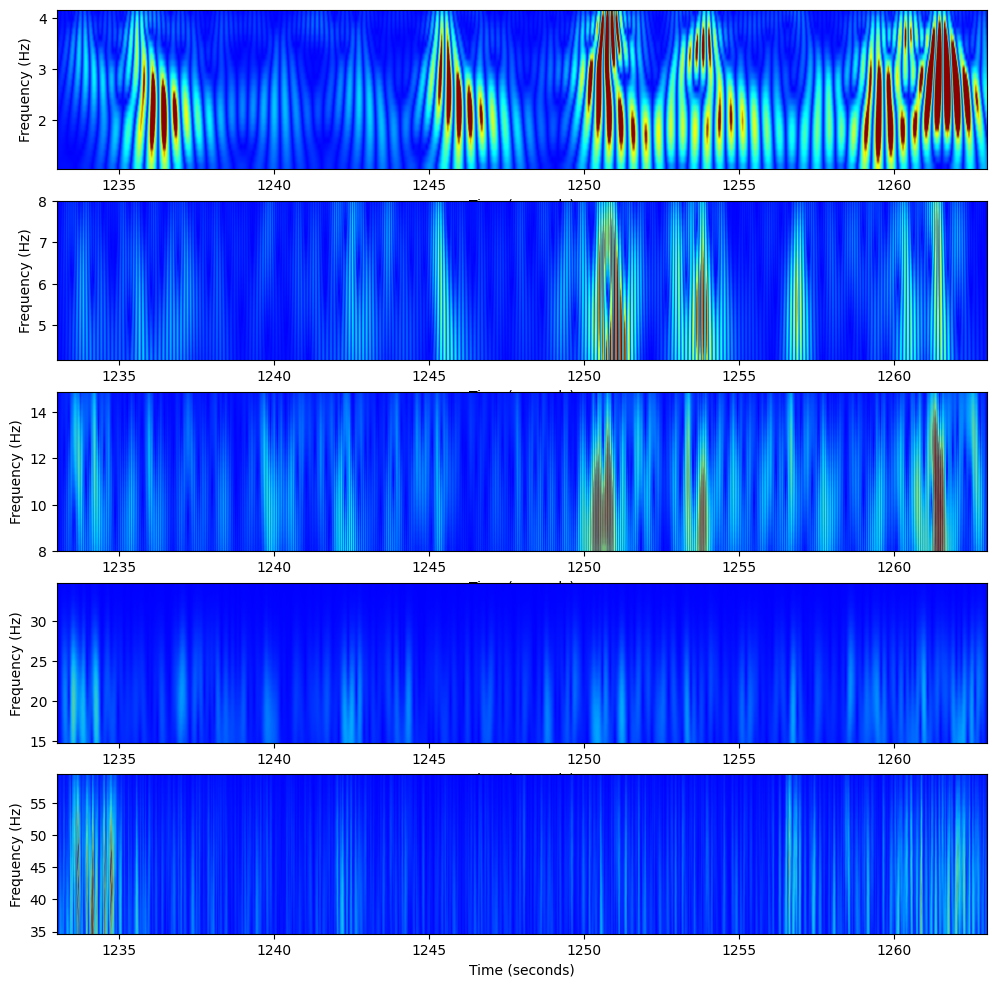

<Figure size 1500x700 with 0 Axes>

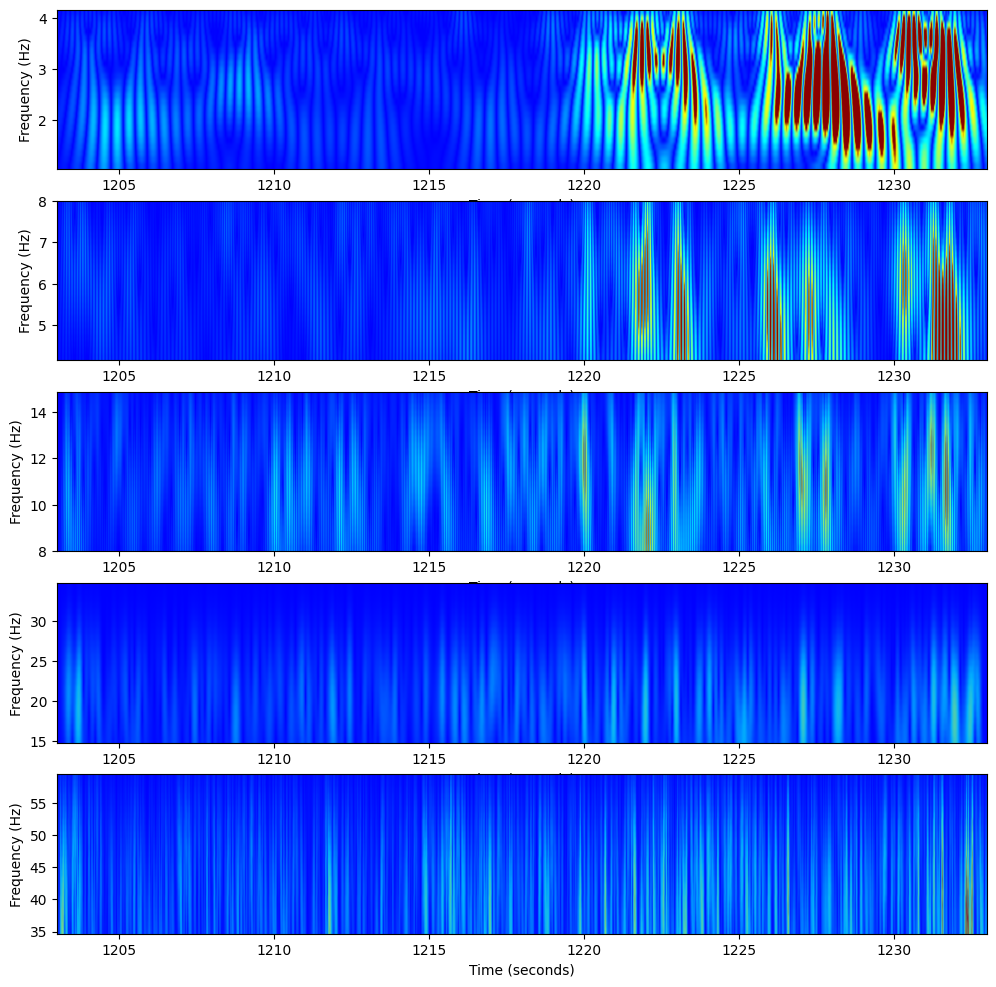

<Figure size 1500x700 with 0 Axes>

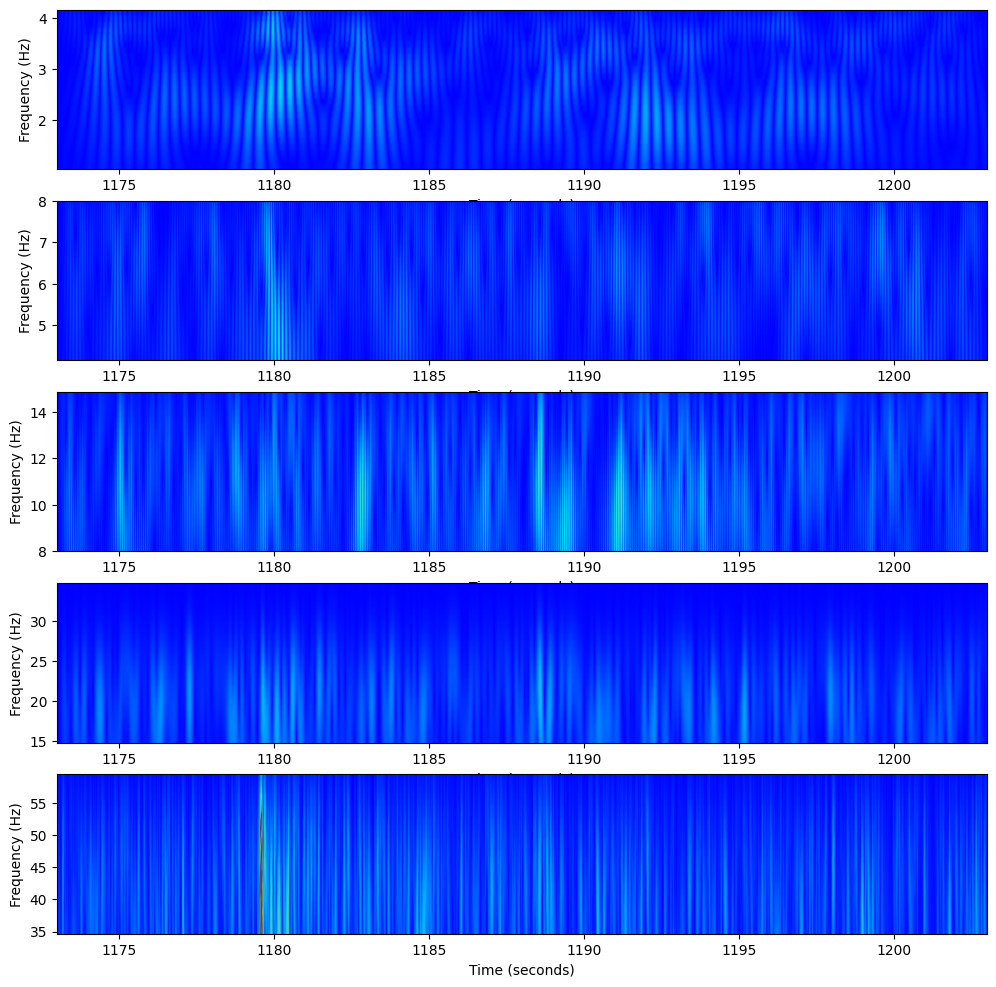

<Figure size 1500x700 with 0 Axes>

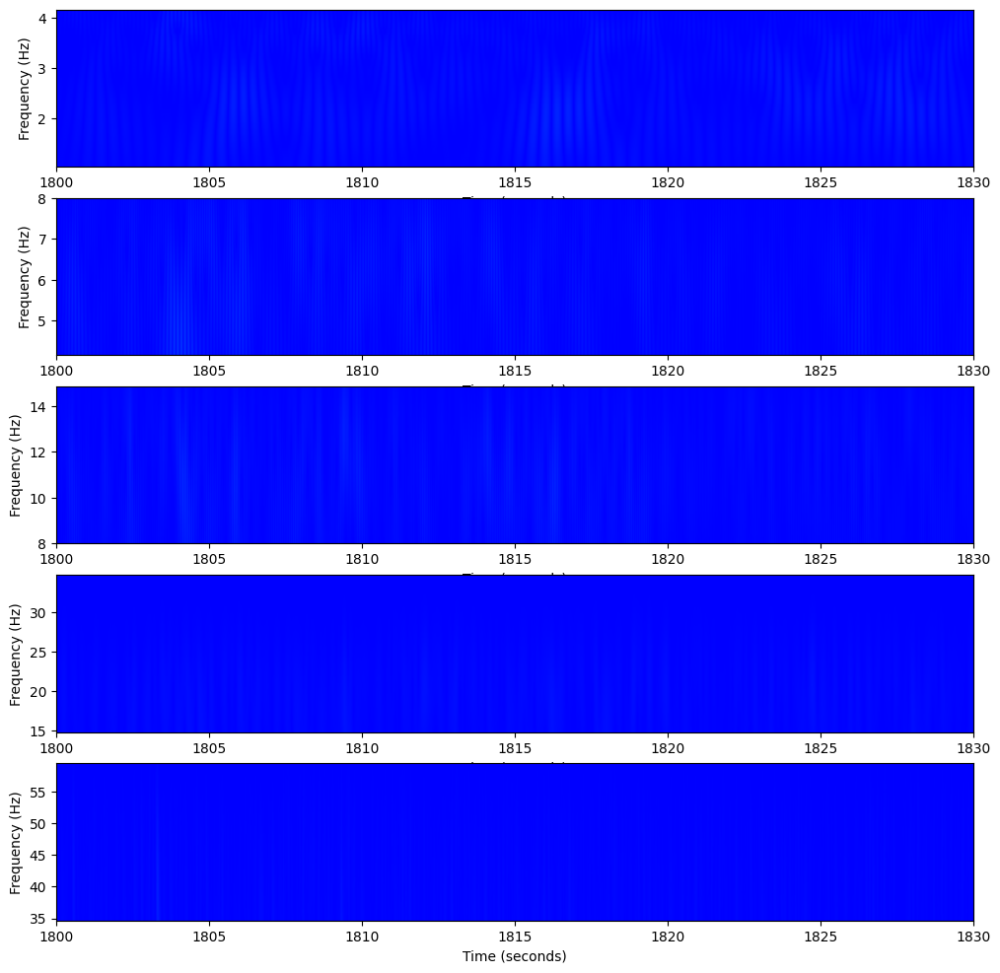

<Figure size 1500x700 with 0 Axes>

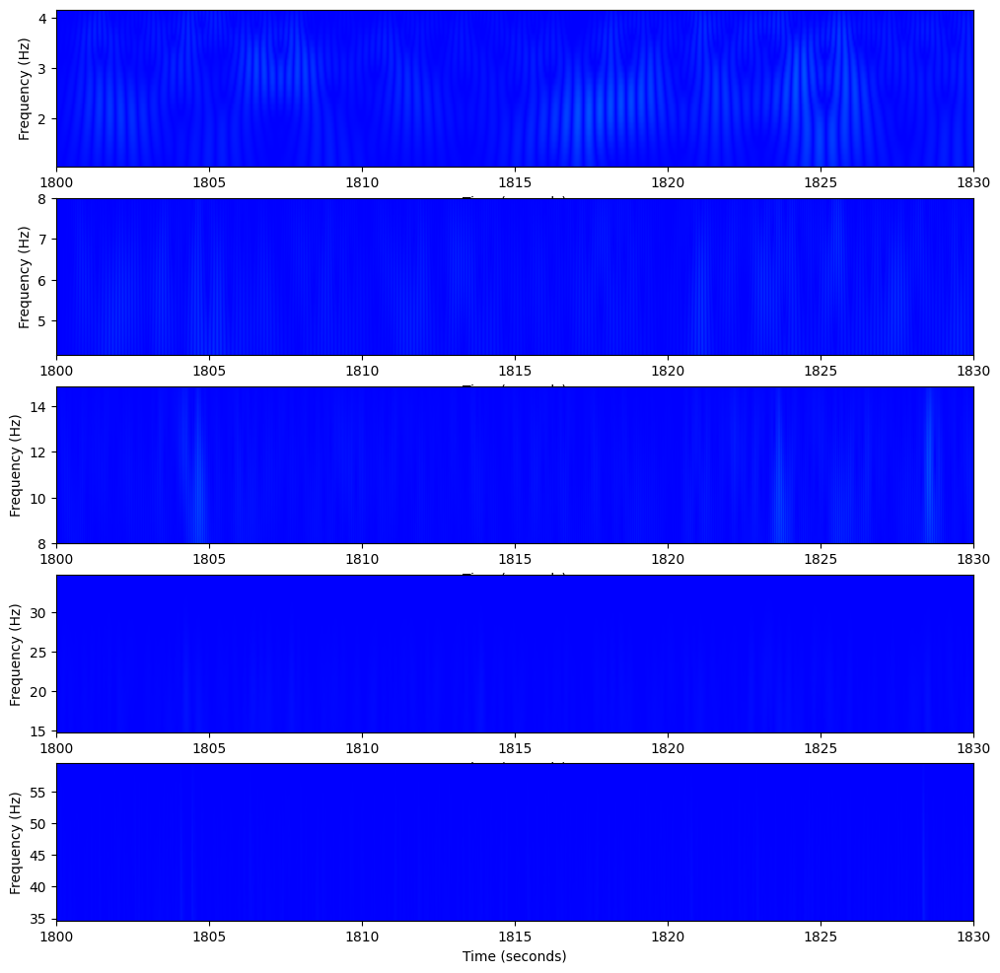

<Figure size 1500x700 with 0 Axes>

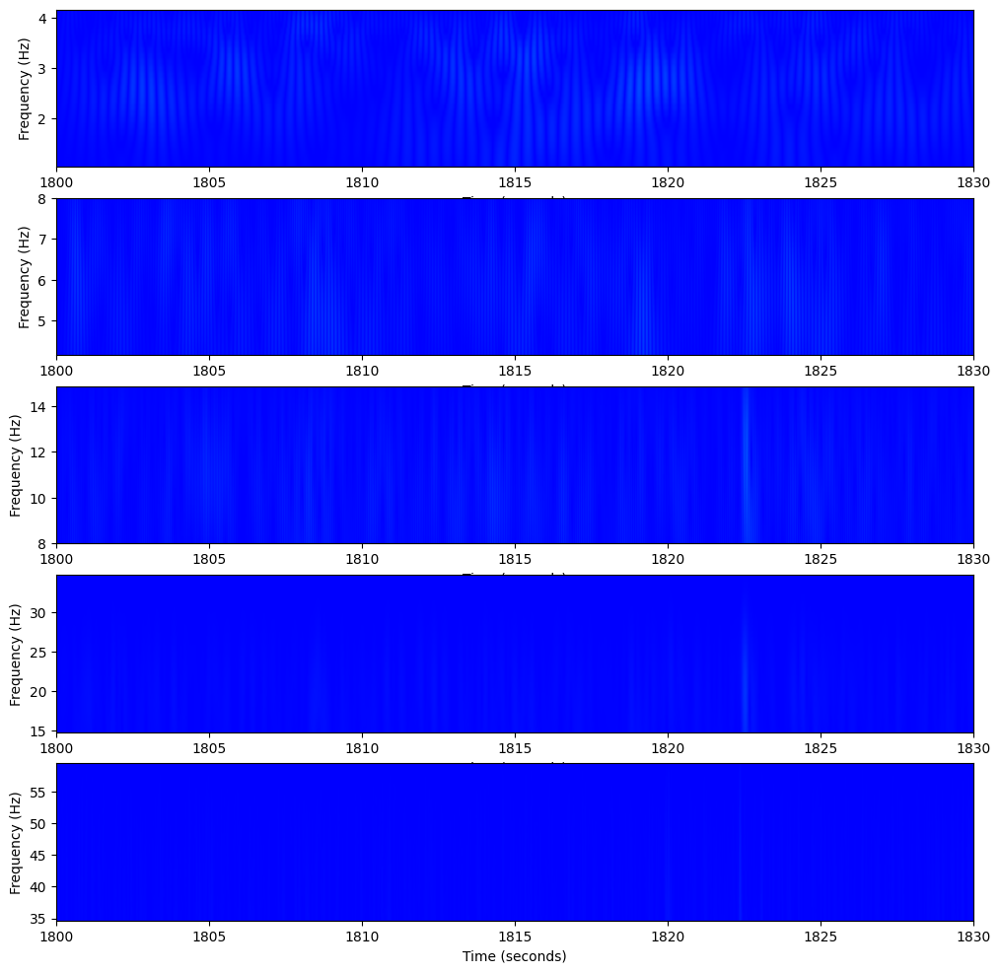

In [12]:
for edf_file in edf_files_list:
    edf_file_path = f'./{edf_file["file_name"]}'
    signals, labels = read_edf(edf_file_path)

    if len(edf_file['seizure_start']) != 0:
        flag = 1
        seizure_times = [(30, '30_sec_before'), (30, '60_sec_before'), (30, '90_sec_before')]
        number = 1
        for seiz_time in range(len(edf_file['seizure_start'])):
            seizure_st = edf_file['seizure_start'][seiz_time]
            seizure_en = edf_file['seizure_end'][seiz_time]
            for time_offset, time_label in seizure_times:
                time_window_start = seizure_st - time_offset
                time_window_end = seizure_st  # Окно в 30 секунд
                seizure_st = seizure_st - 30
                time_window_start_samples = time_window_start * sampling_rate
                time_window_end_samples = time_window_end * sampling_rate
                signal_s = np.delete(signals, [len(signals) - 1], axis=0)
                time = np.arange(time_window_start, time_window_end, 1 / sampling_rate)

                # Усреднение сигналов
                avg_signal = np.zeros(time_window_end_samples - time_window_start_samples)
                for i in range(len(signals) - 1):
                    avg_signal += signal_s[i, time_window_start_samples:time_window_end_samples]
                avg_signal /= len(signals)

                # Применение фильтра Баттерворта
                filtered_data = butter_bandpass_filter(avg_signal, sampling_rate, plot_signal=False)
                filtered_mean = mean_delete(filtered_data, window_count, sampling_rate,time,plot_signal=False)

                # Определяем директорию и путь для сохранения изображения
                save_dir = './seizure'
                os.makedirs(save_dir, exist_ok=True)

                # Сохранение изображения
                image_path = f"{edf_file['file_name']}_{time_label}_{number}_wavelet.png"
                save_wavelet_transform(
                    filtered_mean,
                    image_path,
                    save_dir,
                    time_window_start,
                    time_window_end,
                    sampling_rate,
                    time_label
                )
                number+=1
    else:
        # Обработка для записей без приступа (Healthy)
        flag = 0
        #приступов нет, поэтому выбираем любое значение времени для выгрузки ЭЭГ
        time_window_start = int(signals.shape[1] / sampling_rate / 2)
        time_label = 30 #ширина окна для выгрузки данных
        time_window_end = time_window_start + time_label

        time_window_start_samples = time_window_start * sampling_rate
        time_window_end_samples = time_window_end * sampling_rate

        signals = np.delete(signals, [len(signals) - 1], axis=0)
        time = np.arange(time_window_start, time_window_end, 1 / sampling_rate)

        # Усреднение сигналов
        avg_signal = np.zeros(time_window_end_samples - time_window_start_samples)
        for i in range(len(signals) - 1):
            # Проходим по всем каналам
            avg_signal += signals[i, time_window_start_samples:time_window_end_samples]
            avg_signal /= len(signals)  # Среднее значение по всем каналам

        # Фильр Баттерворта
        filtered_data = butter_bandpass_filter(avg_signal, sampling_rate, plot_signal=False)

        # Удаление среднего скользящим окном
        filtered_mean = mean_delete(filtered_data, window_count, sampling_rate,time, plot_signal=False)

        # Определяем директорию и путь для сохранения изображения
        save_dir = './healthy'
        os.makedirs(save_dir, exist_ok=True)
        image_path = f"{edf_file['file_name']}_{time_label}_wavelet.png"

        # Сохранение изображения
        save_wavelet_transform(
            filtered_mean,
            image_path,
            save_dir,
            time_window_start,
            time_window_end,
            sampling_rate,
            time_label
        )

###Задание 4
Спроектируйте сверточную нейронную сеть для обучения классификации ЭЭГ на те данные, которые имеют и не имеют приступ.


In [51]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, Flatten, LSTM, Dense, Dropout, Reshape, TimeDistributed, BatchNormalization
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.callbacks import ModelCheckpoint

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, accuracy_score, confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score
)
from sklearn.utils import class_weight, shuffle

import tensorflow as tf

In [52]:
# Функция для загрузки изображений
def load_images(target_size):
    images = []
    labels = []
    for class_dir in ['healthy', 'seizure']:  # Подкаталоги классов
        class_path = f'./{class_dir}'
        label = 0 if class_dir == 'healthy' else 1  # Классы кодируются как 0 или 1
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            img = plt.imread(img_path)
            img = tf.image.resize(img, target_size)  # Изменение размеров изображения
            images.append(img)
            labels.append(label)

    plt.show()

    images = np.array(images)
    labels = np.array(labels)

    return images, labels

In [53]:
def display_samples(X, y, num_samples, dataset_name='Dataset'):
    plt.figure(figsize=(10, 10))
    for i in range(num_samples):
        plt.imshow(X[i,:,:,:])
        plt.title(f'Label: {np.argmax(y[i])}')
        plt.axis('off')

    plt.suptitle(f'Sample images from {dataset_name}')
    plt.show()

In [54]:
X, y = load_images((512, 512),)

In [55]:
X, y = shuffle(X, y, random_state=24)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [56]:
# Преобразование меток в категориальный формат (one-hot encoding)
y_train = tf.keras.utils.to_categorical(y_train, num_classes=2)
y_test = tf.keras.utils.to_categorical(y_test, num_classes=2)

In [57]:
y_train = y_train.astype(np.float64)
X_train = X_train.astype(np.float64)

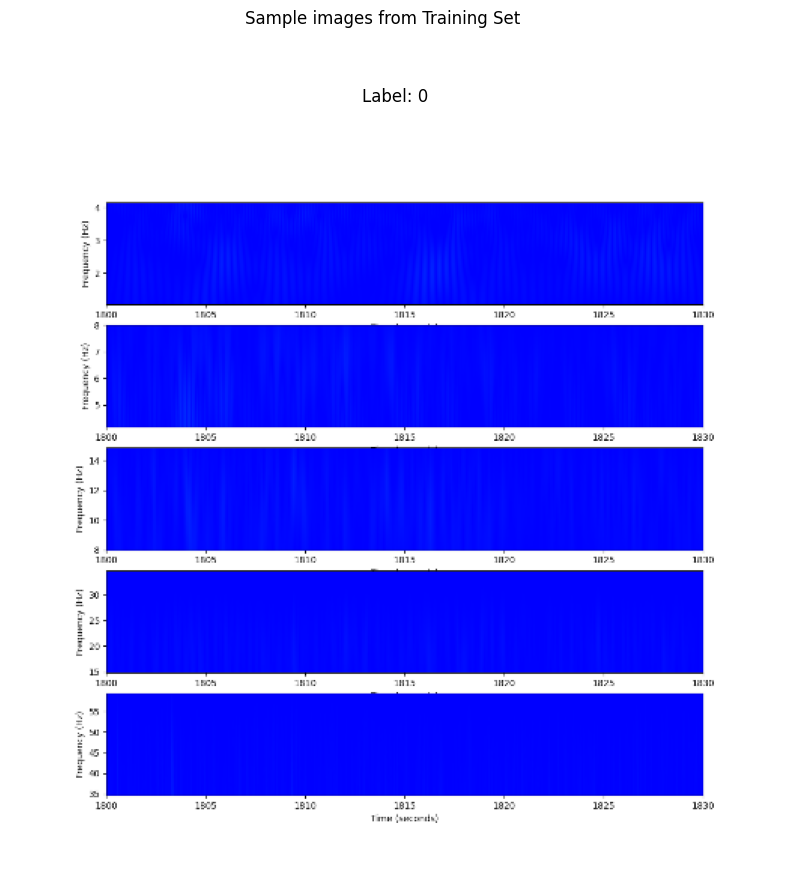

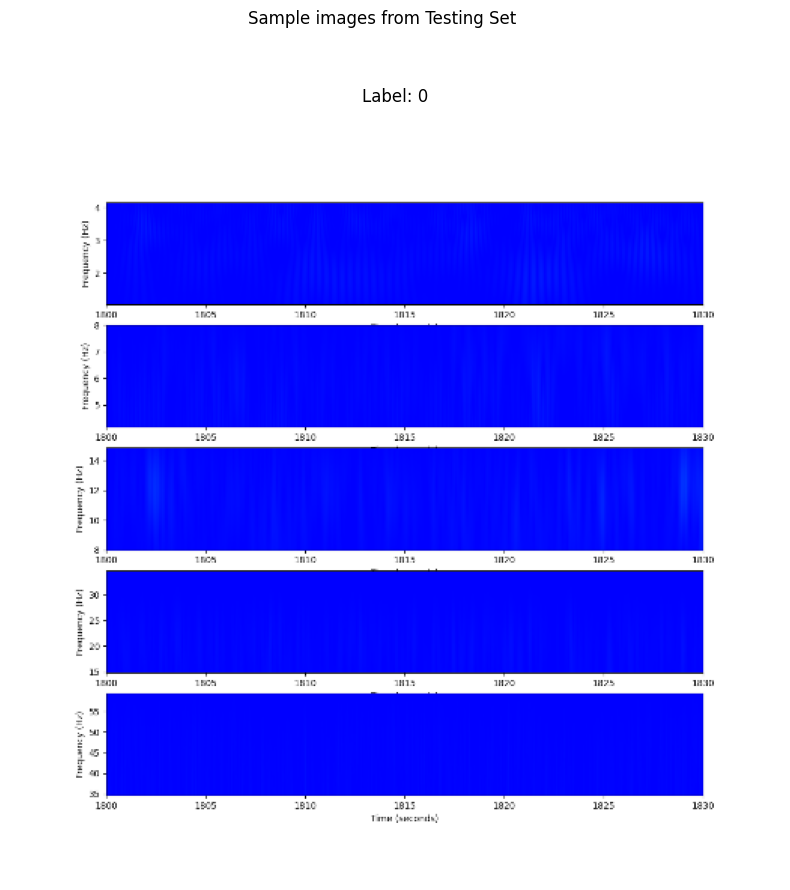

In [58]:
display_samples(X_train, y_train, num_samples=3, dataset_name='Training Set')
display_samples(X_test, y_test, num_samples=3, dataset_name='Testing Set')

In [59]:
def create_cnn_lstm_model(input_shape):
    model = Sequential()

    # Cверточные слои
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D((2, 2)))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))

    model.add(Flatten())

    # Полносвязный слой
    model.add(Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.05)))
    model.add(Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.05)))

    # Выходной слой для двух классов
    model.add(Dense(2, activation='sigmoid'))  # Для классификации на 2 класса

    # Компиляция модели
    model.compile(optimizer=Adam(learning_rate=1e-3), loss='categorical_crossentropy', metrics=['accuracy'])

    return model

In [60]:
input_shape = (512, 512, 4)  # Изображения 64x64 с 3 каналами (RGB)
model = create_cnn_lstm_model(input_shape)
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 510, 510, 32)        │           1,184 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 255, 255, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 253, 253, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 126, 126, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 124, 124, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 246016)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │      31,490,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 2)                   │             514 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 31,580,322 (120.47 MB)

 Trainable params: 31,580,322 (120.47 MB)

 Non-trainable params: 0 (0.00 B)

In [61]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=40, restore_best_weights=True)

# Преобразование меток обратно из one-hot encoding в одномерный массив меток
y_train_classes = np.argmax(y_train, axis=1)

# Вычисление весов классов
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_train_classes), y=y_train_classes)

# Преобразование class_weights в словарь
class_weights_dict = dict(enumerate(class_weights))

checkpoint = ModelCheckpoint(
    'best_weights.keras',    # Имя файла для сохранения весов
    monitor='val_accuracy',  # Метрика для отслеживания
    save_best_only=True,     # Сохранять только если улучшилась метрика
    mode='max',              # "max" для максимизации метрики
    verbose=1
)

# Обучение модели с указанием весов классов
history = model.fit(
    X_train,
    y_train,
    epochs=5,
    batch_size=8,
    validation_split=0.2,
    class_weight=class_weights_dict,
    callbacks=[early_stopping]
)

Epoch 1/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 28s 7s/step - accuracy: 0.5734 - loss: 21.4308 - val_accuracy: 1.0000 - val_loss: 11.1077
Epoch 2/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 16s 5s/step - accuracy: 0.5516 - loss: 12.6334 - val_accuracy: 0.0000e+00 - val_loss: 12.2864
Epoch 3/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 20s 6s/step - accuracy: 0.2086 - loss: 11.8739 - val_accuracy: 0.0000e+00 - val_loss: 11.8486
Epoch 4/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 16s 6s/step - accuracy: 0.2772 - loss: 11.6009 - val_accuracy: 0.0000e+00 - val_loss: 11.1063
Epoch 5/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 30s 6s/step - accuracy: 0.4015 - loss: 10.4774 - val_accuracy: 1.0000 - val_loss: 9.4577


In [62]:
y_test__pred = model.predict(X_test)
y_test__pred = np.argmax(y_test__pred, axis=1)

y_test__true = np.argmax(y_test, axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


In [63]:
print('Classification Report:')
print(classification_report(y_test__true, y_test__pred))
print('Accuracy:', accuracy_score(y_test__true, y_test__pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.75      1.00      0.86         6
           1       0.00      0.00      0.00         2

    accuracy                           0.75         8
   macro avg       0.38      0.50      0.43         8
weighted avg       0.56      0.75      0.64         8

Accuracy: 0.75


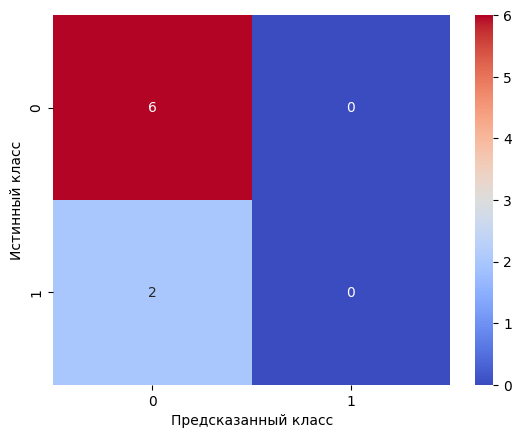

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [64]:
conf_matrix = confusion_matrix(y_test__true, y_test__pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='coolwarm')
class_names = ['Содержащий приступ', 'Не содержащий приступ']

plt.xlabel('Предсказанный класс')
plt.ylabel('Истинный класс')
plt.show()
plt.figure()

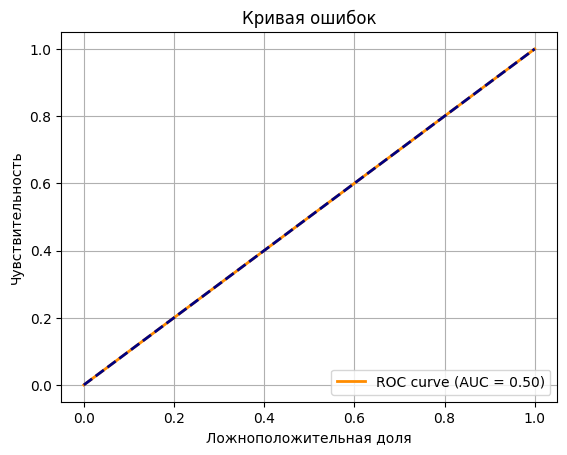

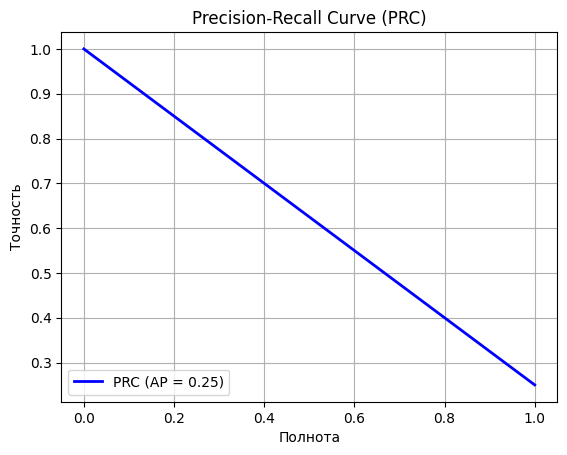

In [65]:
fpr, tpr, _ = roc_curve(y_test__true, y_test__pred)

roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Диагональная линия
plt.xlabel('Ложноположительная доля')
plt.ylabel('Чувствительность')
plt.title('Кривая ошибок')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Построение Precision-Recall кривой
precision, recall, _ = precision_recall_curve(y_test__true, y_test__pred)
average_precision = average_precision_score(y_test__true, y_test__pred)

plt.figure()
plt.plot(recall, precision, color='blue', lw=2, label=f'PRC (AP = {average_precision:.2f})')
plt.xlabel('Полнота')
plt.ylabel('Точность')
plt.title('Precision-Recall Curve (PRC)')
plt.legend(loc='lower left')
plt.grid()
plt.show()

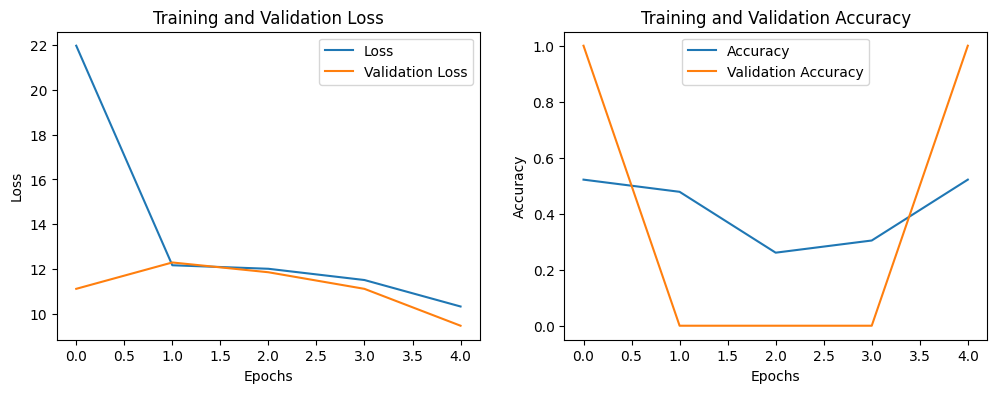

In [66]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

plt.close()

###Задание 5
Сохраните модель обученной сети и проверьте ее работу.


In [29]:
# Сохранение модели
model.save('cnn_eeg_epilepsy_model.h5')

In [30]:
# Сохранение весов
model.save_weights('model_weights.weights.h5')

In [31]:
loaded_model = tf.keras.models.load_model('cnn_eeg_epilepsy_model.h5')

In [32]:
y_test__pred_from_loaded = loaded_model.predict(X_test)
y_test__pred_from_loaded = np.argmax(y_test__pred_from_loaded, axis=1)

accuracy_score(y_test__true, y_test__pred_from_loaded)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


1.0

In [33]:
import mne

In [34]:
data = mne.io.read_raw_edf('eeg1.edf', preload=True)

Extracting EDF parameters from /content/eeg1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1790207  =      0.000 ...  6992.996 secs...


In [35]:
eeg_data, eeg_times = data.get_data(return_times=True)

In [36]:
f'число отчетов во временном ряду: {len(eeg_times)}'

'число отчетов во временном ряду: 1790208'

In [37]:
# устанавливаем диапазон для обработки данных
t_index_begin = np.where(eeg_times > 1 * 318 - 300)[0][0]
t_index_end = np.where(eeg_times > 1 * 452 + 300)[0][0]
t = eeg_times[t_index_begin:t_index_end]

# значение времени = конец сигнала
T = t[-1] - t[0]
# число элементов во временном ряду
N = len(t)

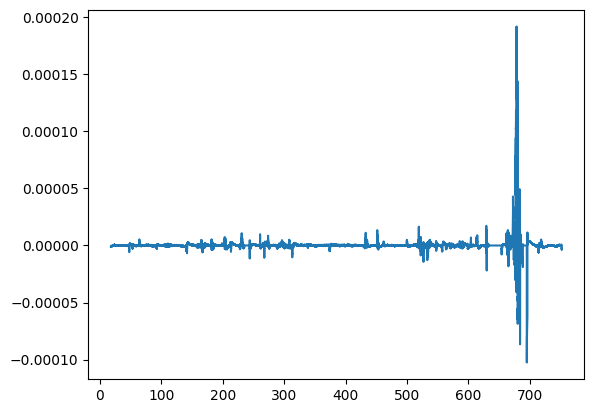

In [38]:
y=[]

for i in range(len(eeg_data)-2):
    y =+ eeg_data[i, t_index_begin:t_index_end]

y = y / (len(eeg_data) - 1)
plt.plot(t, y)
plt.show()

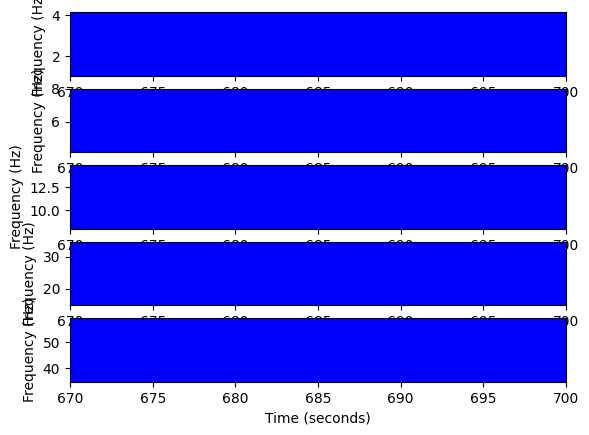

'./testEDFepi/testEDFepi_wavelet.png_30_wavelet.png'

In [39]:
seizure_st = 670
sampling_rate = 256
signals = y
time_label = 30

time_window_start = seizure_st
seizure_st = seizure_st + 30
time_window_end = seizure_st

time = np.arange(time_window_start, time_window_end, 1 / sampling_rate)

# Применение фильтра Баттерворта
filtered_data = butter_bandpass_filter(y, sampling_rate, plot_signal=False)
# filtered_mean = mean_delete(filtered_data, window_count, sampling_rate, time, plot_signal=False)
filtered_mean = filtered_data

# Определяем директорию и путь для сохранения изображения
save_dir = './testEDFepi'
os.makedirs(save_dir, exist_ok=True)

# Сохранение изображения
image_path = 'testEDFepi_wavelet.png'
save_wavelet_transform(
    filtered_mean,
    image_path,
    save_dir,
    time_window_start,
    time_window_end,
    sampling_rate,
    time_label
)

In [40]:
images = []
class_path = './testEDFepi'
for img_name in os.listdir(class_path):
    img_path = os.path.join(class_path, img_name)
    img = plt.imread(img_path)
    img = tf.image.resize(img, (512, 515))
    images.append(img)

plt.show()

images = np.array(images)

In [41]:
y_image = loaded_model.predict(images)
np.argmax(y_image, axis=1)

InvalidArgumentError: Graph execution error:

Detected at node sequential_1/flatten_1/Reshape defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py", line 37, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 992, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 712, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 205, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 608, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 84, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 510, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 499, in process_one

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 406, in dispatch_shell

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 730, in execute_request

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/ipkernel.py", line 383, in do_execute

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/zmqshell.py", line 528, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2975, in run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3030, in _run_cell

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/async_helpers.py", line 78, in _pseudo_sync_runner

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3257, in run_cell_async

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3473, in run_ast_nodes

  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code

  File "<ipython-input-41-ce416c7d1c8e>", line 1, in <cell line: 0>

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 562, in predict

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 259, in one_step_on_data_distributed

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 249, in one_step_on_data

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 104, in predict_step

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py", line 908, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/models/sequential.py", line 213, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py", line 182, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/function.py", line 171, in _run_through_graph

  File "/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py", line 637, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py", line 908, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/operation.py", line 46, in __call__

  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 156, in error_handler

  File "/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py", line 54, in call

  File "/usr/local/lib/python3.11/dist-packages/keras/src/ops/numpy.py", line 4868, in reshape

  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/numpy.py", line 1915, in reshape

Only one input size may be -1, not both 0 and 1
	 [[{{node sequential_1/flatten_1/Reshape}}]] [Op:__inference_one_step_on_data_distributed_4251]

###Задание 6
Попробуйте проделать действия с использованием AutoML и сравните ратоту.

In [67]:
import autokeras as ak

In [68]:
import mlflow

In [69]:
clf = ak.ImageClassifier(overwrite=True, max_trials=1)

In [70]:
y_train_classes = np.argmax(y_train, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

In [71]:
clf.fit(X_train, y_train_classes, epochs=5)

ValueError: The dataset should at least contain 2 batches to be split.

In [ ]:
best_model.layers

In [ ]:
y_train__predicted = clf.predict(X_train)

In [ ]:
y_test__predicted = clf.predict(X_test)

In [ ]:
clf.evaluate(X_test, y_test_classes)

In [ ]:
print('Classification Report Test Data:')
print(classification_report(y_test_classes, y_test__predicted))
print('Accuracy:', accuracy_score(y_test_classes, y_test__predicted))

In [ ]:
print('Classification Report Train Data:')
print(classification_report(y_train_classes, y_train__predicted))
print('Accuracy:', accuracy_score(y_train_classes, y_train__predicted))

In [ ]:
conf_matrix = confusion_matrix(y_test_classes, y_test__predicted)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='coolwarm')
class_names = ['Содержащий приступ', 'Не содержащий приступ']

plt.xlabel('Предсказанный класс')
plt.ylabel('Истинный класс')
plt.show()
plt.figure()

In [ ]:
mlflow.set_tracking_uri(uri='http://127.0.0.1:8080')
mlflow.set_experiment('Task3')

In [ ]:
with mlflow.start_run(run_name='AUTOKERAS'):
    mlflow.log_params(
        {
            'overwrite': True,
            'max_trials': 1,
            'epochs': 5
        }
    )
    mlflow.log_metrics(
        {
            'Accuracy для обучающих данных': accuracy_score(y_train_classes, y_train__predicted),
            'Accuracy для тестовых данных': accuracy_score(y_test_classes, y_test__predicted),
        }
    )
    mlflow.log_artifact('./image_classifier/best_pipeline')

In [ ]:
import pandas as pd
from lightautoml.tasks import Task
from lightautoml.automl.presets.image_presets import TabularCVAutoML

In [ ]:
healthy_images = []
dir_name = './healthy'
for path in os.listdir(dir_name):
    healthy_images.append(f'{dir_name}/{path}')

In [ ]:
seizure_images = []
dir_name = './seizure'
for path in os.listdir(dir_name):
    seizure_images.append(f'{dir_name}/{path}')

In [ ]:
data = pd.DataFrame(
    {
        'path': healthy_images + seizure_images,
        'label': [0] * len(healthy_images) + [1] * len(seizure_images)
    }
)
data

In [ ]:
train_data, test_data = train_test_split(data, test_size=0.2, stratify=data['label'], random_state=42)

In [ ]:
automl = TabularCVAutoML(
    task = Task('binary'),
    timeout=5 * 3600,
    cpu_limit = 2,
    reader_params = {'cv': 5, 'random_state': 42}
)

In [ ]:
predictions = automl.fit_predict(train_data, roles={'target': 'label', 'path': ['path']}, verbose=3)

In [ ]:
test_predictions = automl.predict(test_data).data

In [ ]:
for i in range(len(test_predictions)):
    if test_predictions[i] > 0.5:
        test_predictions[i] = 1
    else:
        test_predictions[i] = 0

In [ ]:
predictions_data = predictions.data
for i in range(len(predictions_data)):
    if predictions_data[i] > 0.5:
        predictions_data[i] = 1
    else:
        predictions_data[i] = 0

In [ ]:
print('Classification Report Test Data:')
print(classification_report(test_data['label'], test_predictions))
print('Accuracy:', accuracy_score(test_data['label'], test_predictions))

In [ ]:
print('Classification Report Train Data:')
print(classification_report(train_data['label'], predictions_data))
print('Accuracy:', accuracy_score(train_data['label'], predictions_data))

In [ ]:
conf_matrix = confusion_matrix(test_data['label'], test_predictions)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='coolwarm')
class_names = ['Содержащий приступ', 'Не содержащий приступ']

plt.xlabel('Предсказанный класс')
plt.ylabel('Истинный класс')
plt.show()
plt.figure()

In [ ]:
print(automl.create_model_str_desc())

In [ ]:
algo = automl.levels[0][0].ml_algos[0]
model = algo.models[0]
print(f'Алгоритм - {type(algo).__name__}\nМодель - {type(model).__name__}\n')

In [ ]:
with open(f'./lightautoml_electrocardiogram_task5_model.pkl', 'wb') as f:
    pickle.dump(automl, f)

In [ ]:
with mlflow.start_run(run_name='LAMA'):
    mlflow.log_params(
        {
            'cv': 5,
            'random_state': 42,
            'timeout': 5 * 3600,
            'cpu_limit': 2,
            'algoritm': algo,
            'model': model
        }
    )
    mlflow.log_metrics(
        {
            'Accuracy train data': accuracy_score(train_data['label'], predictions_data),
            'Accuracy test data':  accuracy_score(test_data['label'], test_predictions),
        }
    )
    mlflow.log_artifact('./lightautoml_electrocardiogram_task5_model.pkl')

    model_info = mlflow.sklearn.log_model(
        sk_model=automl,
        artifact_path='lama_model',
        signature=mlflow.models.infer_signature(train_data, predictions_data),
        input_example=train_data,
    )